<a href="https://colab.research.google.com/github/yayanberutu/face_spoofing_detection_fasterrcnn/blob/master/training_with_VGG16.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
import random
import pprint
import sys
import time
import numpy as np
from optparse import OptionParser
import pickle
import math
import cv2
import copy
from matplotlib import pyplot as plt
import tensorflow as tf
import pandas as pd
import os

from sklearn.metrics import average_precision_score

from keras import backend as K
from keras.optimizers import Adam, SGD, RMSprop
from keras.layers import Flatten, Dense, Input, Conv2D, MaxPooling2D, Dropout, ZeroPadding2D, Convolution2D, Activation, Add, AveragePooling2D, Layer, InputSpec
from keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, TimeDistributed
from keras.engine.topology import get_source_inputs
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras.objectives import categorical_crossentropy

from keras.models import Model
from keras.utils import generic_utils
from keras import initializers, regularizers

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
tf.__version__

'2.5.0'

**Preprocessing Image**

In [ ]:
def resize(img, height=224, width=224):
    resize_img = cv2.resize(img, (width, height), interpolation=cv2.INTER_NEAREST)
    return resize_img

In [ ]:
def denoise(img):
    denoise_img = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 15)
    return denoise_img

**Util**

In [ ]:
def display(a, title1 = "image"):
    plt.imshow(a), plt.title(title1)
    plt.show()

In [ ]:
def display_with_bboxes(img, x1, y1, x2, y2):
    cv2.rectangle(img, (x1,y1), (x2, y2), (255, 0, 0), 5)
    display(img)

**Konfigurasi**

In [ ]:
class Config:
	def __init__(self):

		# Print the process or not
		self.verbose = True

		# Name of base network
		self.network = 'vgg'

		# Setting for data augmentation
		self.use_horizontal_flips = False
		self.use_vertical_flips = False
		self.rot_90 = False

		# Anchor box scales
    # Note that if im_size is smaller, anchor_box_scales should be scaled
    # Original anchor_box_scales in the paper is [128, 256, 512]
		self.anchor_box_scales = [64, 128, 256] 

		# Anchor box ratios
		self.anchor_box_ratios = [[1, 1], [1./math.sqrt(2), 2./math.sqrt(2)], [2./math.sqrt(2), 1./math.sqrt(2)]]

		# Size to resize the smallest side of the image
		# Original setting in paper is 600. Set to 300 in here to save training time
		self.im_size = 300

		# image channel-wise mean to subtract
		self.img_channel_mean = [103.939, 116.779, 123.68]
		self.img_scaling_factor = 1.0

		# number of ROIs at once
		self.num_rois = 4

		# stride at the RPN (this depends on the network configuration)
		self.rpn_stride = 16

		self.balanced_classes = False

		# scaling the stdev
		self.std_scaling = 4.0
		self.classifier_regr_std = [8.0, 8.0, 4.0, 4.0]

		# overlaps for RPN
		self.rpn_min_overlap = 0.3
		self.rpn_max_overlap = 0.7

		# overlaps for classifier ROIs
		self.classifier_min_overlap = 0.1
		self.classifier_max_overlap = 0.5

		# placeholder for the class mapping, automatically generated by the parser
		self.class_mapping = None

		self.model_path = None

**Ambil Data Gambar dari file txt**

In [ ]:
def get_data(input_path):
  """Parse the data from annotation file
  
  Args:
    input_path: annotation file path
      
  Returns:
		all_data: list(filepath, width, height, list(bboxes))
		classes_count: dict{key:class_name, value:count_num} 
			e.g. {'Car': 2383, 'Mobile phone': 1108, 'Person': 3745}
		class_mapping: dict{key:class_name, value: idx}
			e.g. {'Car': 0, 'Mobile phone': 1, 'Person': 2}
	"""
  found_bg = False
  all_imgs = {}

  classes_count = {}

  class_mapping = {}

  visualise = True

  i = 1
  count_spoof = 0
  count_live = 0
  with open(input_path,'r') as f:
    print('Parsing annotation files')
    it = 0
    for line in f:
      if it == 100:
        print("BERAKHIR")
        break
      
      i += 1
      line_split = line.strip().split(',')
			# Make sure the info saved in annotation file matching the format (path_filename, x1, y1, x2, y2, class_name)
			# Note:
			#	One path_filename might has several classes (class_name)
			#	x1, y1, x2, y2 are the pixel value of the origial image, not the ratio value
			#	(x1, y1) top left coordinates; (x2, y2) bottom right coordinates
			#   x1,y1-------------------
			#	     |	            					          |
			#	     |						                      | 
			#	     |						                      |
			#      |						                      |
			#	     ---------------------x2,y2
      (filename,x1,y1,x2,y2,class_name) = line_split
            
      filename = '/content/drive/MyDrive/Semester 6/TA/DATASET/' + filename

      img = cv2.imread(filename)
      
      if img is None:
        print("Gambar tidak bisa ditemukan")
        continue
      
      if class_name == 'spoof':
        if (count_spoof) == 50:
          # print("Spoof Max")
          continue
        print("SPOOF")
        count_spoof += 1
      if class_name == 'live':
        if(count_live) == 50:
          # print("Live Max")
          continue
        print("LIVE")
        count_live += 1

      it += 1
      print("count spoof:", count_spoof, "count live", count_live)
      # counter gambar
      sys.stdout.write('\r' + 'gbr ke: ' + str(it))


      if class_name not in classes_count:
        classes_count[class_name] = 1
      else:
        classes_count[class_name] += 1

      if class_name not in class_mapping:
        if class_name == 'bg' and found_bg == False:
          print('Found class name with special name bg. Will be treated as a background region (this is usually for hard negative mining).')
          found_bg = True
        class_mapping[class_name] = len(class_mapping)

      if filename not in all_imgs:
        all_imgs[filename] = {}
				
        # img = cv2.imread(filename)
        
        # if img is None:
        #   print("Gambar tidak bisa ditemukan")
        #   continue
        
        
        img = resize(img, 224, 224)
        # img = denoise(img)
        display_with_bboxes(img, int(x1), int(y1), int(x2), int(y2))

        (rows,cols) = img.shape[:2]
        print("Ukuran:")
        print(rows)
        print(cols)
        all_imgs[filename]['filepath'] = filename
        all_imgs[filename]['width'] = cols
        all_imgs[filename]['height'] = rows
        all_imgs[filename]['bboxes'] = []
				# if np.random.randint(0,6) > 0:
				# 	all_imgs[filename]['imageset'] = 'trainval'
				# else:
				# 	all_imgs[filename]['imageset'] = 'test'

      all_imgs[filename]['bboxes'].append({'class': class_name, 'x1': int(x1), 'x2': int(x2), 'y1': int(y1), 'y2': int(y2)})


    all_data = []
    for key in all_imgs:
      all_data.append(all_imgs[key])
		
		# make sure the bg class is last in the list
    if found_bg:
      if class_mapping['bg'] != len(class_mapping) - 1:
        key_to_switch = [key for key in class_mapping.keys() if class_mapping[key] == len(class_mapping)-1][0]
        val_to_switch = class_mapping['bg']
        class_mapping['bg'] = len(class_mapping) - 1
        class_mapping[key_to_switch] = val_to_switch
		
    return all_data, classes_count, class_mapping

**Implementasi ROI Polling Convolutional Layer**

In [ ]:
class RoiPoolingConv(Layer):
    def __init__(self, pool_size, num_rois, **kwargs):

        self.dim_ordering = K.image_data_format()
        self.pool_size = pool_size
        self.num_rois = num_rois

        super(RoiPoolingConv, self).__init__(**kwargs)

    def build(self, input_shape):
        self.nb_channels = input_shape[0][3]   

    def compute_output_shape(self, input_shape):
        return None, self.num_rois, self.pool_size, self.pool_size, self.nb_channels

    def call(self, x, mask=None):

        assert(len(x) == 2)

        # x[0] is image with shape (rows, cols, channels)
        img = x[0]

        # x[1] is roi with shape (num_rois,4) with ordering (x,y,w,h)
        rois = x[1]

        input_shape = K.shape(img)

        outputs = []

        for roi_idx in range(self.num_rois):

            x = rois[0, roi_idx, 0]
            y = rois[0, roi_idx, 1]
            w = rois[0, roi_idx, 2]
            h = rois[0, roi_idx, 3]

            x = K.cast(x, 'int32')
            y = K.cast(y, 'int32')
            w = K.cast(w, 'int32')
            h = K.cast(h, 'int32')

            # Resized roi of the image to pooling size (7x7)
            #img = resize(img)
            rs = tf.image.resize(img[:, y:y+h, x:x+w, :], (self.pool_size, self.pool_size))
            outputs.append(rs)
                

        final_output = K.concatenate(outputs, axis=0)

        # Reshape to (1, num_rois, pool_size, pool_size, nb_channels)
        # Might be (1, 4, 7, 7, 3)
        final_output = K.reshape(final_output, (1, self.num_rois, self.pool_size, self.pool_size, self.nb_channels))

        # permute_dimensions is similar to transpose
        final_output = K.permute_dimensions(final_output, (0, 1, 2, 3, 4))

        return final_output
    
    
    def get_config(self):
        config = {'pool_size': self.pool_size,
                  'num_rois': self.num_rois}
        base_config = super(RoiPoolingConv, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

**Implentasi CNN Arsitektur CNN**

In [ ]:
def get_img_output_length(width, height):
    def get_output_length(input_length):
        return input_length//16

    return get_output_length(width), get_output_length(height)    

In [ ]:
def vgg16(input_tensor=None, trainable=False):
    input_shape = (None, None, 3)

    if input_tensor is None:
        img_input = Input(shape=input_shape)
    else:
        if not K.is_keras_tensor(input_tensor):
            img_input = Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor

    bn_axis = 3

    # Block 1
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    # x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

    return x

**Implementasi Resnet CNN**

In [ ]:
def get_img_output_length(width, height):
    def get_output_length(input_length):
        return input_length//16

    return get_output_length(width), get_output_length(height)   

In [ ]:
def identity_block(input_tensor, kernel_size, filters, stage, block, trainable=True):

    nb_filter1, nb_filter2, nb_filter3 = filters
    
    bn_axis = 3

    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = Convolution2D(nb_filter1, (1, 1), name=conv_name_base + '2a', trainable=trainable)(input_tensor)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter2, (kernel_size, kernel_size), padding='same', name=conv_name_base + '2b', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter3, (1, 1), name=conv_name_base + '2c', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2c')(x)

    x = Add()([x, input_tensor])
    x = Activation('relu')(x)
    return x

In [ ]:
def identity_block_td(input_tensor, kernel_size, filters, stage, block, trainable=True):

    # identity block time distributed

    nb_filter1, nb_filter2, nb_filter3 = filters
    
    bn_axis = 3
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = TimeDistributed(Convolution2D(nb_filter1, (1, 1), trainable=trainable, kernel_initializer='normal'), name=conv_name_base + '2a')(input_tensor)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter2, (kernel_size, kernel_size), trainable=trainable, kernel_initializer='normal',padding='same'), name=conv_name_base + '2b')(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter3, (1, 1), trainable=trainable, kernel_initializer='normal'), name=conv_name_base + '2c')(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2c')(x)

    x = Add()([x, input_tensor])
    x = Activation('relu')(x)

    return x


In [ ]:
def conv_block(input_tensor, kernel_size, filters, stage, block, strides=(2, 2), trainable=True):

    nb_filter1, nb_filter2, nb_filter3 = filters
    bn_axis = 3

    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = Convolution2D(nb_filter1, (1, 1), strides=strides, name=conv_name_base + '2a', trainable=trainable)(input_tensor)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter2, (kernel_size, kernel_size), padding='same', name=conv_name_base + '2b', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter3, (1, 1), name=conv_name_base + '2c', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2c')(x)

    shortcut = Convolution2D(nb_filter3, (1, 1), strides=strides, name=conv_name_base + '1', trainable=trainable)(input_tensor)
    shortcut = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '1')(shortcut)

    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

In [ ]:
def conv_block_td(input_tensor, kernel_size, filters, stage, block, input_shape, strides=(2, 2), trainable=True):

    # conv block time distributed

    nb_filter1, nb_filter2, nb_filter3 = filters
    bn_axis = 3
    

    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = TimeDistributed(Convolution2D(nb_filter1, (1, 1), strides=strides, trainable=trainable, kernel_initializer='normal'), input_shape=input_shape, name=conv_name_base + '2a')(input_tensor)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter2, (kernel_size, kernel_size), padding='same', trainable=trainable, kernel_initializer='normal'), name=conv_name_base + '2b')(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter3, (1, 1), kernel_initializer='normal'), name=conv_name_base + '2c', trainable=trainable)(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2c')(x)

    shortcut = TimeDistributed(Convolution2D(nb_filter3, (1, 1), strides=strides, trainable=trainable, kernel_initializer='normal'), name=conv_name_base + '1')(input_tensor)
    shortcut = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '1')(shortcut)

    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x


In [ ]:
def nn_base(input_tensor=None, trainable=False):

    # Determine proper input shape
    input_shape = (None, None, 3)

    if input_tensor is None:
        img_input = Input(shape=input_shape)
    else:
        if not K.is_keras_tensor(input_tensor):
            img_input = Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor

    bn_axis = 3
    
    x = ZeroPadding2D((3, 3))(img_input)

    x = Convolution2D(64, (7, 7), strides=(2, 2), name='conv1', trainable = trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name='bn_conv1')(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((3, 3), strides=(2, 2))(x)

    x = conv_block(x, 3, [64, 64, 256], stage=2, block='a', strides=(1, 1), trainable = trainable)
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='b', trainable = trainable)
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='c', trainable = trainable)

    x = conv_block(x, 3, [128, 128, 512], stage=3, block='a', trainable = trainable)
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='b', trainable = trainable)
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='c', trainable = trainable)
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='d', trainable = trainable)

    x = conv_block(x, 3, [256, 256, 1024], stage=4, block='a', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='b', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='c', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='d', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='e', trainable = trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='f', trainable = trainable)

    return x

In [ ]:
def classifier_layers(x, input_shape, trainable=False):

    # compile times on theano tend to be very high, so we use smaller ROI pooling regions to workaround
    # (hence a smaller stride in the region that follows the ROI pool)
    x = conv_block_td(x, 3, [512, 512, 2048], stage=5, block='a', input_shape=input_shape, strides=(2, 2), trainable=trainable)


    x = identity_block_td(x, 3, [512, 512, 2048], stage=5, block='b', trainable=trainable)
    x = identity_block_td(x, 3, [512, 512, 2048], stage=5, block='c', trainable=trainable)
    x = TimeDistributed(AveragePooling2D((7, 7)), name='avg_pool')(x)

    return x

In [ ]:
def classifier(base_layers, input_rois, num_rois, nb_classes=2, trainable=False):

    # compile times on theano tend to be very high, so we use smaller ROI pooling regions to workaround
    print("A")
    pooling_regions = 14
    input_shape = (num_rois, 14, 14, 1024)

    out_roi_pool = RoiPoolingConv(pooling_regions, num_rois)([base_layers, input_rois])
    out = classifier_layers(out_roi_pool, input_shape=input_shape, trainable=True)

    out = TimeDistributed(Flatten())(out)

    out_class = TimeDistributed(Dense(nb_classes, activation='softmax', kernel_initializer='zero'), name='dense_class_{}'.format(nb_classes))(out)
    # note: no regression target for bg class
    out_regr = TimeDistributed(Dense(4 * (nb_classes-1), activation='linear', kernel_initializer='zero'), name='dense_regress_{}'.format(nb_classes))(out)
    return [out_class, out_regr]

In [ ]:
def rpn_layer(base_layers, num_anchors):
    """Fungsi ini digunakan untuk membuat layer RPN
        Step1:  Feature Map dari layer sebelumnya di berikan ke 3x3 512 channels convolutional layer
                 Padding kita set sebagai 'same' untuk mempertahankan size dari feature map
        Step2:  Hasil dari step1 diberikan kepada 2 (1,1) layer convolutional untuk menggantikan fully connected layer
                classification layer: num_anchors (misalnya 9, karena size dari step 1 berukuran 3x3) channels untuk 0, 1 untuk sigmoid activation output
                regression layer: num_anchors*4 (36) channels untuk komputasi  regression of bboxes dengan linear activation
    Args:
        base_layers: vgg
        num_anchors: 9 in here

    Returns:
        [x_class, x_regr, base_layers]
        x_class: classification for whether it's an object
        x_regr: bboxes regression
        base_layers: vgg 
    """
    x = Conv2D(512, (3, 3), padding='same', activation='relu', kernel_initializer='normal', name='rpn_conv1')(base_layers)

    x_class = Conv2D(num_anchors, (1, 1), activation='sigmoid', kernel_initializer='uniform', name='rpn_out_class')(x)
    x_regr = Conv2D(num_anchors * 4, (1, 1), activation='linear', kernel_initializer='zero', name='rpn_out_regress')(x)

    return [x_class, x_regr, base_layers]

In [ ]:
class FixedBatchNormalization(Layer):

    def __init__(self, epsilon=1e-3, axis=-1,
                 weights=None, beta_init='zero', gamma_init='one',
                 gamma_regularizer=None, beta_regularizer=None, **kwargs):

        self.supports_masking = True
        self.beta_init = initializers.get(beta_init)
        self.gamma_init = initializers.get(gamma_init)
        self.epsilon = epsilon
        self.axis = axis
        self.gamma_regularizer = regularizers.get(gamma_regularizer)
        self.beta_regularizer = regularizers.get(beta_regularizer)
        self.initial_weights = weights
        super(FixedBatchNormalization, self).__init__(**kwargs)

    def build(self, input_shape):
        self.input_spec = [InputSpec(shape=input_shape)]
        shape = (input_shape[self.axis],)
        # print(shape)
        self.gamma = self.add_weight(shape=shape,
                                     initializer=self.gamma_init,
                                     regularizer=self.gamma_regularizer,
                                     name='{}_gamma'.format(self.name),
                                     trainable=False)
        self.beta = self.add_weight(shape=shape,
                                    initializer=self.beta_init,
                                    regularizer=self.beta_regularizer,
                                    name='{}_beta'.format(self.name),
                                    trainable=False)
        self.running_mean = self.add_weight(shape=shape, initializer='zero',
                                            name='{}_running_mean'.format(self.name),
                                            trainable=False)
        self.running_std = self.add_weight(shape=shape, initializer='one',
                                           name='{}_running_std'.format(self.name),
                                           trainable=False)

        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights

        self.built = True

    def call(self, x, mask=None):

        assert self.built, 'Layer must be built before being called'
        input_shape = K.int_shape(x)

        reduction_axes = list(range(len(input_shape)))
        del reduction_axes[self.axis]
        broadcast_shape = [1] * len(input_shape)
        broadcast_shape[self.axis] = input_shape[self.axis]

        if sorted(reduction_axes) == range(K.ndim(x))[:-1]:
            x_normed = K.batch_normalization(
                x, self.running_mean, self.running_std,
                self.beta, self.gamma,
                epsilon=self.epsilon)
        else:
            # need broadcasting
            broadcast_running_mean = K.reshape(self.running_mean, broadcast_shape)
            broadcast_running_std = K.reshape(self.running_std, broadcast_shape)
            broadcast_beta = K.reshape(self.beta, broadcast_shape)
            broadcast_gamma = K.reshape(self.gamma, broadcast_shape)
            x_normed = K.batch_normalization(
                x, broadcast_running_mean, broadcast_running_std,
                broadcast_beta, broadcast_gamma,
                epsilon=self.epsilon)

        return x_normed

    def get_config(self):
        config = {'epsilon': self.epsilon,
                  'axis': self.axis,
                  'gamma_regularizer': self.gamma_regularizer.get_config() if self.gamma_regularizer else None,
                  'beta_regularizer': self.beta_regularizer.get_config() if self.beta_regularizer else None}
        base_config = super(FixedBatchNormalization, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

**Implementasi RPN Layer**

In [ ]:
def rpn_layer(base_layers, num_anchors):
    """Fungsi ini digunakan untuk membuat layer RPN
        Step1:  Feature Map dari layer sebelumnya di berikan ke 3x3 512 channels convolutional layer
                 Padding kita set sebagai 'same' untuk mempertahankan size dari feature map
        Step2:  Hasil dari step1 diberikan kepada 2 (1,1) layer convolutional untuk menggantikan fully connected layer
                classification layer: num_anchors (misalnya 9, karena size dari step 1 berukuran 3x3) channels untuk 0, 1 untuk sigmoid activation output
                regression layer: num_anchors*4 (36) channels untuk komputasi  regression of bboxes dengan linear activation
    Args:
        base_layers: vgg
        num_anchors: 9 in here

    Returns:
        [x_class, x_regr, base_layers]
        x_class: classification for whether it's an object
        x_regr: bboxes regression
        base_layers: vgg 
    """
    x = Conv2D(512, (3, 3), padding='same', activation='relu', kernel_initializer='normal', name='rpn_conv1')(base_layers)

    x_class = Conv2D(num_anchors, (1, 1), activation='sigmoid', kernel_initializer='uniform', name='rpn_out_class')(x)
    x_regr = Conv2D(num_anchors * 4, (1, 1), activation='linear', kernel_initializer='zero', name='rpn_out_regress')(x)

    return [x_class, x_regr, base_layers]

**Classifier layer**

In [ ]:
def classifier_layer(base_layers, input_rois, num_rois, nb_classes = 4):
    """Create a classifier layer
    
    Args:
        base_layers: vgg
        input_rois: `(1,num_rois,4)` list of rois, with ordering (x,y,w,h)
        num_rois: Jumlah roi yang akan diproses dalam 1 waktu (4 in here)

    Returns:
        list(out_class, out_regr)
        out_class: output untuk classifier layer 
        out_regr: output untuk regression layer 
    """

    input_shape = (num_rois,7,7,512)

    pooling_regions = 7

    # out_roi_pool.shape = (1, num_rois, channels, pool_size, pool_size)
    # num_rois (4) 7x7 roi pooling
    out_roi_pool = RoiPoolingConv(pooling_regions, num_rois)([base_layers, input_rois])

    # Flatten the convlutional layer and connected to 2 FC and 2 dropout
    out = TimeDistributed(Flatten(name='flatten'))(out_roi_pool)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc1'))(out)
    out = TimeDistributed(Dropout(0.5))(out)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc2'))(out)
    out = TimeDistributed(Dropout(0.5))(out)

    # There are two output layer
    # out_class: softmax acivation function for classify the class name of the object
    # out_regr: linear activation function for bboxes coordinates regression
    out_class = TimeDistributed(Dense(nb_classes, activation='softmax', kernel_initializer='zero'), name='dense_class_{}'.format(nb_classes))(out)
    # note: no regression target for bg class
    out_regr = TimeDistributed(Dense(4 * (nb_classes-1), activation='linear', kernel_initializer='zero'), name='dense_regress_{}'.format(nb_classes))(out)

    return [out_class, out_regr]



```
# Ini diformat sebagai kode
```

**Calculate IoU (Intersection of Union)**

In [ ]:
def union(au, bu, area_intersection):
	area_a = (au[2] - au[0]) * (au[3] - au[1])
	area_b = (bu[2] - bu[0]) * (bu[3] - bu[1])
	area_union = area_a + area_b - area_intersection
	return area_union

In [ ]:
def intersection(ai, bi):
	x = max(ai[0], bi[0])
	y = max(ai[1], bi[1])
	w = min(ai[2], bi[2]) - x
	h = min(ai[3], bi[3]) - y
	if w < 0 or h < 0:
		return 0
	return w*h

In [ ]:
def iou(a, b):
	# a and b should be (x1,y1,x2,y2)

	if a[0] >= a[2] or a[1] >= a[3] or b[0] >= b[2] or b[1] >= b[3]:
		return 0.0

	area_i = intersection(a, b)
	area_u = union(a, b, area_i)

	return float(area_i) / float(area_u + 1e-6)

**Calculate the rpn for all anchors of all images**

In [ ]:
def calc_rpn(C, img_data, width, height, resized_width, resized_height, img_length_calc_function):
	"""Menghitung rpn untuk semua anchor
		Jika feature map memiliki ukuran 20x30 dengan channel 3, maka akan ada 600x9= 5400 potential anchor
	
	Args:
		C: config
		img_data: augmented image data
		width: original image width 
		height: original image height
		resized_width: resized image width according to C.im_size (e.g. 300)
		resized_height: resized image height according to C.im_size (e.g. 400)
		img_length_calc_function: fungsi untuk kalkulasi size layer terakhir dari feature map berdasarkan size dari input image

	Returns:
		y_rpn_cls: list(num_bboxes, y_is_box_valid + y_rpn_overlap)
			y_is_box_valid: 0 or 1 (0 means the box is invalid, 1 means the box is valid)
			y_rpn_overlap: 0 or 1 (0 means the box is not an object, 1 means the box is an object)
		y_rpn_regr: list(num_bboxes, 4*y_rpn_overlap + y_rpn_regr)
			y_rpn_regr: x1,y1,x2,y2 bunding boxes coordinates
	"""
	downscale = float(C.rpn_stride) 
	anchor_sizes = C.anchor_box_scales   # 128, 256, 512
	anchor_ratios = C.anchor_box_ratios  # 1:1, 1:2*sqrt(2), 2*sqrt(2):1
	num_anchors = len(anchor_sizes) * len(anchor_ratios) # 3x3=9

	# calculate the output map size based on the network architecture
	(output_width, output_height) = img_length_calc_function(resized_width, resized_height)

	n_anchratios = len(anchor_ratios)    # 3
	
	# initialise empty output objectives
	y_rpn_overlap = np.zeros((output_height, output_width, num_anchors))
	y_is_box_valid = np.zeros((output_height, output_width, num_anchors))
	y_rpn_regr = np.zeros((output_height, output_width, num_anchors * 4))

	num_bboxes = len(img_data['bboxes'])

	num_anchors_for_bbox = np.zeros(num_bboxes).astype(int)
	best_anchor_for_bbox = -1*np.ones((num_bboxes, 4)).astype(int)
	best_iou_for_bbox = np.zeros(num_bboxes).astype(np.float32)
	best_x_for_bbox = np.zeros((num_bboxes, 4)).astype(int)
	best_dx_for_bbox = np.zeros((num_bboxes, 4)).astype(np.float32)

	# get the GT box coordinates, and resize to account for image resizing
	gta = np.zeros((num_bboxes, 4))
	for bbox_num, bbox in enumerate(img_data['bboxes']):
		# get the GT box coordinates, and resize to account for image resizing
		gta[bbox_num, 0] = bbox['x1'] * (resized_width / float(width))
		gta[bbox_num, 1] = bbox['x2'] * (resized_width / float(width))
		gta[bbox_num, 2] = bbox['y1'] * (resized_height / float(height)) 
		gta[bbox_num, 3] = bbox['y2'] * (resized_height / float(height))
	
	# rpn ground truth

	for anchor_size_idx in range(len(anchor_sizes)):
		for anchor_ratio_idx in range(n_anchratios):
			anchor_x = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][0]
			anchor_y = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][1]	
			
			for ix in range(output_width):					
				# x-coordinates of the current anchor box	
				x1_anc = downscale * (ix + 0.5) - anchor_x / 2
				x2_anc = downscale * (ix + 0.5) + anchor_x / 2	
				
				# ignore boxes that go across image boundaries					
				if x1_anc < 0 or x2_anc > resized_width:
					continue
					
				for jy in range(output_height):

					# y-coordinates of the current anchor box
					y1_anc = downscale * (jy + 0.5) - anchor_y / 2
					y2_anc = downscale * (jy + 0.5) + anchor_y / 2

					# ignore boxes that go across image boundaries
					if y1_anc < 0 or y2_anc > resized_height:
						continue

					# bbox_type indicates whether an anchor should be a target
					# Initialize with 'negative'
					bbox_type = 'neg'

					# this is the best IOU for the (x,y) coord and the current anchor
					# note that this is different from the best IOU for a GT bbox
					best_iou_for_loc = 0.0

					for bbox_num in range(num_bboxes):
						
						# get IOU of the current GT box and the current anchor box
						curr_iou = iou([gta[bbox_num, 0], gta[bbox_num, 2], gta[bbox_num, 1], gta[bbox_num, 3]], [x1_anc, y1_anc, x2_anc, y2_anc])
						# calculate the regression targets if they will be needed
						if curr_iou > best_iou_for_bbox[bbox_num] or curr_iou > C.rpn_max_overlap:
							cx = (gta[bbox_num, 0] + gta[bbox_num, 1]) / 2.0
							cy = (gta[bbox_num, 2] + gta[bbox_num, 3]) / 2.0
							cxa = (x1_anc + x2_anc)/2.0
							cya = (y1_anc + y2_anc)/2.0

							# x,y are the center point of ground-truth bbox
							# xa,ya are the center point of anchor bbox (xa=downscale * (ix + 0.5); ya=downscale * (iy+0.5))
							# w,h are the width and height of ground-truth bbox
							# wa,ha are the width and height of anchor bboxe
							# tx = (x - xa) / wa
							# ty = (y - ya) / ha
							# tw = log(w / wa)
							# th = log(h / ha)
							tx = (cx - cxa) / (x2_anc - x1_anc)
							ty = (cy - cya) / (y2_anc - y1_anc)
							tw = np.log((gta[bbox_num, 1] - gta[bbox_num, 0]) / (x2_anc - x1_anc))
							th = np.log((gta[bbox_num, 3] - gta[bbox_num, 2]) / (y2_anc - y1_anc))
						
						if img_data['bboxes'][bbox_num]['class'] != 'bg':

							# all GT boxes should be mapped to an anchor box, so we keep track of which anchor box was best
							if curr_iou > best_iou_for_bbox[bbox_num]:
								best_anchor_for_bbox[bbox_num] = [jy, ix, anchor_ratio_idx, anchor_size_idx]
								best_iou_for_bbox[bbox_num] = curr_iou
								best_x_for_bbox[bbox_num,:] = [x1_anc, x2_anc, y1_anc, y2_anc]
								best_dx_for_bbox[bbox_num,:] = [tx, ty, tw, th]

							# we set the anchor to positive if the IOU is >0.7 (it does not matter if there was another better box, it just indicates overlap)
							if curr_iou > C.rpn_max_overlap:
								bbox_type = 'pos'
								num_anchors_for_bbox[bbox_num] += 1
								# we update the regression layer target if this IOU is the best for the current (x,y) and anchor position
								if curr_iou > best_iou_for_loc:
									best_iou_for_loc = curr_iou
									best_regr = (tx, ty, tw, th)

							# if the IOU is >0.3 and <0.7, it is ambiguous and no included in the objective
							if C.rpn_min_overlap < curr_iou < C.rpn_max_overlap:
								# gray zone between neg and pos
								if bbox_type != 'pos':
									bbox_type = 'neutral'

					# turn on or off outputs depending on IOUs
					if bbox_type == 'neg':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'neutral':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'pos':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						start = 4 * (anchor_ratio_idx + n_anchratios * anchor_size_idx)
						y_rpn_regr[jy, ix, start:start+4] = best_regr

	# we ensure that every bbox has at least one positive RPN region

	for idx in range(num_anchors_for_bbox.shape[0]):
		if num_anchors_for_bbox[idx] == 0:
			# no box with an IOU greater than zero ...
			if best_anchor_for_bbox[idx, 0] == -1:
				continue
			y_is_box_valid[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			y_rpn_overlap[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			start = 4 * (best_anchor_for_bbox[idx,2] + n_anchratios * best_anchor_for_bbox[idx,3])
			y_rpn_regr[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], start:start+4] = best_dx_for_bbox[idx, :]

	y_rpn_overlap = np.transpose(y_rpn_overlap, (2, 0, 1))
	y_rpn_overlap = np.expand_dims(y_rpn_overlap, axis=0)

	y_is_box_valid = np.transpose(y_is_box_valid, (2, 0, 1))
	y_is_box_valid = np.expand_dims(y_is_box_valid, axis=0)

	y_rpn_regr = np.transpose(y_rpn_regr, (2, 0, 1))
	y_rpn_regr = np.expand_dims(y_rpn_regr, axis=0)

	pos_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 1, y_is_box_valid[0, :, :, :] == 1))
	neg_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 0, y_is_box_valid[0, :, :, :] == 1))

	num_pos = len(pos_locs[0])

	# one issue is that the RPN has many more negative than positive regions, so we turn off some of the negative
	# regions. We also limit it to 256 regions.
	num_regions = 256

	if len(pos_locs[0]) > num_regions/2:
		val_locs = random.sample(range(len(pos_locs[0])), len(pos_locs[0]) - num_regions/2)
		y_is_box_valid[0, pos_locs[0][val_locs], pos_locs[1][val_locs], pos_locs[2][val_locs]] = 0
		num_pos = num_regions/2

	if len(neg_locs[0]) + num_pos > num_regions:
		val_locs = random.sample(range(len(neg_locs[0])), len(neg_locs[0]) - num_pos)
		y_is_box_valid[0, neg_locs[0][val_locs], neg_locs[1][val_locs], neg_locs[2][val_locs]] = 0

	y_rpn_cls = np.concatenate([y_is_box_valid, y_rpn_overlap], axis=1)
	y_rpn_regr = np.concatenate([np.repeat(y_rpn_overlap, 4, axis=1), y_rpn_regr], axis=1)

	return np.copy(y_rpn_cls), np.copy(y_rpn_regr), num_pos

**Get new image size and augment the image**

In [ ]:
def get_new_img_size(width, height, img_min_side=300):
      if width <= height:
            f = float(img_min_side) / width
            resized_height = int(f * height)
            resized_width = img_min_side
      else:
            f = float(img_min_side) / height
            resized_width = int(f * width)
            resized_height = img_min_side
      return resized_width, resized_height

In [ ]:
def augment(img_data, config, augment=True):
  assert 'filepath' in img_data
  assert 'bboxes' in img_data
  assert 'width' in img_data
  assert 'height' in img_data
  
  print("AAA")
  img_data_aug = copy.deepcopy(img_data)

  img = cv2.imread(img_data_aug['filepath'])
  img = resize(img, 224, 224)
  img = denoise(img)
  print("BBB")
  if augment:
    print("CCC")
    rows, cols = img.shape[:2]
    
    if config.use_horizontal_flips and np.random.randint(0, 2) == 0:
      print("DDD")
      img = cv2.flip(img, 1)
      for bbox in img_data_aug['bboxes']:
        x1 = bbox['x1']
        x2 = bbox['x2']
        bbox['x2'] = cols - x1
        bbox['x1'] = cols - x2

    if config.use_vertical_flips and np.random.randint(0, 2) == 0:
      print("EEE")
      img = cv2.flip(img, 0)
      for bbox in img_data_aug['bboxes']:
        y1 = bbox['y1']
        y2 = bbox['y2']
        bbox['y2'] = rows - y1
        bbox['y1'] = rows - y2

    if config.rot_90:
      angle = np.random.choice([0,90,180,270],1)[0]
      if angle == 270:
        img = np.transpose(img, (1,0,2))
        img = cv2.flip(img, 0)
      elif angle == 180:
        img = cv2.flip(img, -1)
      elif angle == 90:
        img = np.transpose(img, (1,0,2))
        img = cv2.flip(img, 1)
      elif angle == 0:
        pass

      for bbox in img_data_aug['bboxes']:
        x1 = bbox['x1']
        x2 = bbox['x2']
        y1 = bbox['y1']
        y2 = bbox['y2']
        if angle == 270:
          bbox['x1'] = y1
          bbox['x2'] = y2
          bbox['y1'] = cols - x2
          bbox['y2'] = cols - x1
        elif angle == 180:
          bbox['x2'] = cols - x1
          bbox['x1'] = cols - x2
          bbox['y2'] = rows - y1
          bbox['y1'] = rows - y2
        elif angle == 90:
          bbox['x1'] = rows - y2
          bbox['x2'] = rows - y1
          bbox['y1'] = x1
          bbox['y2'] = x2        
        elif angle == 0:
          pass

  img_data_aug['width'] = img.shape[1]
  img_data_aug['height'] = img.shape[0]
  return img_data_aug, img

**Generate ground_truth anchor**

In [ ]:
def get_anchor_gt(all_img_data, C, img_length_calc_function, mode='train'):
  while True:
    print("Looping while")
    for img_data in all_img_data:
      print("Looping for")
      try:
        print("AA")
        # read in image, and optionally add augmentation
        if mode == 'train':
          print("BB")
          img_data_aug, x_img = augment(img_data, C, augment=True)
        else:
          img_data_aug, x_img = augment(img_data, C, augment=False)
        
        print("CC")
        (width, height) = (img_data_aug['width'], img_data_aug['height'])
        (rows, cols, _) = x_img.shape
        
        assert cols == width
        assert rows == height
        
        # get image dimensions for resizing
        print("DD")
        (resized_width, resized_height) = get_new_img_size(width, height, C.im_size)
        
        # resize the image so that smalles side is length = 300px
        
        print("EE")
        x_img = cv2.resize(x_img, (resized_width, resized_height), interpolation=cv2.INTER_CUBIC)
        debug_img = x_img.copy()
        
        print("FF")
        try:
          print("GG")
          y_rpn_cls, y_rpn_regr, num_pos = calc_rpn(C, img_data_aug, width, height, resized_width, resized_height, img_length_calc_function)
        except:
          continue
          
        # Zero-center by mean pixel, and preprocess image
        
        print("HH")
        x_img = x_img[:,:, (2, 1, 0)]  # BGR -> RGB
        x_img = x_img.astype(np.float32)
        x_img[:, :, 0] -= C.img_channel_mean[0]
        x_img[:, :, 1] -= C.img_channel_mean[1]
        x_img[:, :, 2] -= C.img_channel_mean[2]
        x_img /= C.img_scaling_factor
        
        x_img = np.transpose(x_img, (2, 0, 1))
        x_img = np.expand_dims(x_img, axis=0)
        
        y_rpn_regr[:, y_rpn_regr.shape[1]//2:, :, :] *= C.std_scaling
        
        x_img = np.transpose(x_img, (0, 2, 3, 1))
        y_rpn_cls = np.transpose(y_rpn_cls, (0, 2, 3, 1))
        y_rpn_regr = np.transpose(y_rpn_regr, (0, 2, 3, 1))
        print("II")        
        yield np.copy(x_img), [np.copy(y_rpn_cls), np.copy(y_rpn_regr)], img_data_aug, debug_img, num_pos
      except Exception as e:
        print(e)
				

**Define loss functions for all four outputs**

In [ ]:
lambda_rpn_regr = 1.0
lambda_rpn_class = 1.0

lambda_cls_regr = 1.0
lambda_cls_class = 1.0

epsilon = 1e-4

In [ ]:
def rpn_loss_regr(num_anchors):
    """Loss function for rpn regression
    Args:
        num_anchors: number of anchors (9 in here)
    Returns:
        Smooth L1 loss function 
                           0.5*x*x (if x_abs < 1)
                           x_abx - 0.5 (otherwise)
    """
    def rpn_loss_regr_fixed_num(y_true, y_pred):

        # x is the difference between true value and predicted vaue
        x = y_true[:, :, :, 4 * num_anchors:] - y_pred

        # absolute value of x
        x_abs = K.abs(x)

        # If x_abs <= 1.0, x_bool = 1
        x_bool = K.cast(K.less_equal(x_abs, 1.0), tf.float32)

        return lambda_rpn_regr * K.sum(
            y_true[:, :, :, :4 * num_anchors] * (x_bool * (0.5 * x * x) + (1 - x_bool) * (x_abs - 0.5))) / K.sum(epsilon + y_true[:, :, :, :4 * num_anchors])

    return rpn_loss_regr_fixed_num

In [ ]:
def rpn_loss_cls(num_anchors):
    """Loss function for rpn classification
    Args:
        num_anchors: number of anchors (9 in here)
        y_true[:, :, :, :9]: [0,1,0,0,0,0,0,1,0] means only the second and the eighth box is valid which contains pos or neg anchor => isValid
        y_true[:, :, :, 9:]: [0,1,0,0,0,0,0,0,0] means the second box is pos and eighth box is negative
    Returns:
        lambda * sum((binary_crossentropy(isValid*y_pred,y_true))) / N
    """
    def rpn_loss_cls_fixed_num(y_true, y_pred):

            return lambda_rpn_class * K.sum(y_true[:, :, :, :num_anchors] * K.binary_crossentropy(y_pred[:, :, :, :], y_true[:, :, :, num_anchors:])) / K.sum(epsilon + y_true[:, :, :, :num_anchors])

    return rpn_loss_cls_fixed_num

In [ ]:
def class_loss_regr(num_classes):
    """Loss function for rpn regression
    Args:
        num_anchors: number of anchors (9 in here)
    Returns:
        Smooth L1 loss function 
                           0.5*x*x (if x_abs < 1)
                           x_abx - 0.5 (otherwise)
    """
    def class_loss_regr_fixed_num(y_true, y_pred):
        # x = y_true[:, :, 4*num_classes:] - y_pred
        a = y_true[:, :, 4*num_classes:]
        print("nilai a adalah: ", a)
        print("nilai y_pred adalah: ", y_pred)
        x = a - y_pred
        x_abs = K.abs(x)
        x_bool = K.cast(K.less_equal(x_abs, 1.0), 'float32')
        return lambda_cls_regr * K.sum(y_true[:, :, :4*num_classes] * (x_bool * (0.5 * x * x) + (1 - x_bool) * (x_abs - 0.5))) / K.sum(epsilon + y_true[:, :, :4*num_classes])
    return class_loss_regr_fixed_num

In [ ]:
def class_loss_cls(y_true, y_pred):
    return lambda_cls_class * K.mean(categorical_crossentropy(y_true[0, :, :], y_pred[0, :, :]))

In [ ]:
def non_max_suppression_fast(boxes, probs, overlap_thresh=0.9, max_boxes=300):
    # code used from here: http://www.pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/
    # if there are no boxes, return an empty list

    # Process explanation:
    #   Step 1: Sort the probs list
    #   Step 2: Find the larget prob 'Last' in the list and save it to the pick list
    #   Step 3: Calculate the IoU with 'Last' box and other boxes in the list. If the IoU is larger than overlap_threshold, delete the box from list
    #   Step 4: Repeat step 2 and step 3 until there is no item in the probs list 
    if len(boxes) == 0:
        return []

    # grab the coordinates of the bounding boxes
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    np.testing.assert_array_less(x1, x2)
    np.testing.assert_array_less(y1, y2)

    # if the bounding boxes integers, convert them to floats --
    # this is important since we'll be doing a bunch of divisions
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")

    # initialize the list of picked indexes	
    pick = []

    # calculate the areas
    area = (x2 - x1) * (y2 - y1)

    # sort the bounding boxes 
    idxs = np.argsort(probs)

    # keep looping while some indexes still remain in the indexes
    # list
    while len(idxs) > 0:
        # grab the last index in the indexes list and add the
        # index value to the list of picked indexes
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)

        # find the intersection

        xx1_int = np.maximum(x1[i], x1[idxs[:last]])
        yy1_int = np.maximum(y1[i], y1[idxs[:last]])
        xx2_int = np.minimum(x2[i], x2[idxs[:last]])
        yy2_int = np.minimum(y2[i], y2[idxs[:last]])

        ww_int = np.maximum(0, xx2_int - xx1_int)
        hh_int = np.maximum(0, yy2_int - yy1_int)

        area_int = ww_int * hh_int

        # find the union
        area_union = area[i] + area[idxs[:last]] - area_int

        # compute the ratio of overlap
        overlap = area_int/(area_union + 1e-6)

        # delete all indexes from the index list that have
        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > overlap_thresh)[0])))

        if len(pick) >= max_boxes:
            break

    # return only the bounding boxes that were picked using the integer data type
    boxes = boxes[pick].astype("int")
    probs = probs[pick]
    return boxes, probs

In [ ]:
def apply_regr_np(X, T):
    """Apply regression layer to all anchors in one feature map

    Args:
        X: shape=(4, 18, 25) the current anchor type for all points in the feature map
        T: regression layer shape=(4, 18, 25)

    Returns:
        X: regressed position and size for current anchor
    """
    try:
        x = X[0, :, :]
        y = X[1, :, :]
        w = X[2, :, :]
        h = X[3, :, :]

        tx = T[0, :, :]
        ty = T[1, :, :]
        tw = T[2, :, :]
        th = T[3, :, :]

        cx = x + w/2.
        cy = y + h/2.
        cx1 = tx * w + cx
        cy1 = ty * h + cy

        w1 = np.exp(tw.astype(np.float64)) * w
        h1 = np.exp(th.astype(np.float64)) * h
        x1 = cx1 - w1/2.
        y1 = cy1 - h1/2.

        x1 = np.round(x1)
        y1 = np.round(y1)
        w1 = np.round(w1)
        h1 = np.round(h1)
        return np.stack([x1, y1, w1, h1])
    except Exception as e:
        print(e)
        return X

In [ ]:
def apply_regr(x, y, w, h, tx, ty, tw, th):
    # Apply regression to x, y, w and h
    try:
        cx = x + w/2.
        cy = y + h/2.
        cx1 = tx * w + cx
        cy1 = ty * h + cy
        w1 = math.exp(tw) * w
        h1 = math.exp(th) * h
        x1 = cx1 - w1/2.
        y1 = cy1 - h1/2.
        x1 = int(round(x1))
        y1 = int(round(y1))
        w1 = int(round(w1))
        h1 = int(round(h1))

        return x1, y1, w1, h1

    except ValueError:
        return x, y, w, h
    except OverflowError:
        return x, y, w, h
    except Exception as e:
        print(e)
        return x, y, w, h

In [ ]:
def calc_iou(R, img_data, C, class_mapping):
    """Converts from (x1,y1,x2,y2) to (x,y,w,h) format

    Args:
        R: bboxes, probs
    """
    bboxes = img_data['bboxes']
    (width, height) = (img_data['width'], img_data['height'])
    # get image dimensions for resizing
    (resized_width, resized_height) = get_new_img_size(width, height, C.im_size)

    gta = np.zeros((len(bboxes), 4))

    for bbox_num, bbox in enumerate(bboxes):
        # get the GT box coordinates, and resize to account for image resizing
        # gta[bbox_num, 0] = (40 * (600 / 800)) / 16 = int(round(1.875)) = 2 (x in feature map)
        gta[bbox_num, 0] = int(round(bbox['x1'] * (resized_width / float(width))/C.rpn_stride))
        gta[bbox_num, 1] = int(round(bbox['x2'] * (resized_width / float(width))/C.rpn_stride))
        gta[bbox_num, 2] = int(round(bbox['y1'] * (resized_height / float(height))/C.rpn_stride))
        gta[bbox_num, 3] = int(round(bbox['y2'] * (resized_height / float(height))/C.rpn_stride))

    x_roi = []
    y_class_num = []
    y_class_regr_coords = []
    y_class_regr_label = []
    IoUs = [] # for debugging only

    # R.shape[0]: number of bboxes (=300 from non_max_suppression)
    for ix in range(R.shape[0]):
        (x1, y1, x2, y2) = R[ix, :]
        x1 = int(round(x1))
        y1 = int(round(y1))
        x2 = int(round(x2))
        y2 = int(round(y2))

        best_iou = 0.0
        best_bbox = -1
        # Iterate through all the ground-truth bboxes to calculate the iou
        for bbox_num in range(len(bboxes)):
            curr_iou = iou([gta[bbox_num, 0], gta[bbox_num, 2], gta[bbox_num, 1], gta[bbox_num, 3]], [x1, y1, x2, y2])

            # Find out the corresponding ground-truth bbox_num with larget iou
            if curr_iou > best_iou:
                best_iou = curr_iou
                best_bbox = bbox_num

        if best_iou < C.classifier_min_overlap:
                continue
        else:
            w = x2 - x1
            h = y2 - y1
            x_roi.append([x1, y1, w, h])
            IoUs.append(best_iou)

            if C.classifier_min_overlap <= best_iou < C.classifier_max_overlap:
                # hard negative example
                cls_name = 'bg'
            elif C.classifier_max_overlap <= best_iou:
                cls_name = bboxes[best_bbox]['class']
                cxg = (gta[best_bbox, 0] + gta[best_bbox, 1]) / 2.0
                cyg = (gta[best_bbox, 2] + gta[best_bbox, 3]) / 2.0

                cx = x1 + w / 2.0
                cy = y1 + h / 2.0

                tx = (cxg - cx) / float(w)
                ty = (cyg - cy) / float(h)
                tw = np.log((gta[best_bbox, 1] - gta[best_bbox, 0]) / float(w))
                th = np.log((gta[best_bbox, 3] - gta[best_bbox, 2]) / float(h))
            else:
                print('roi = {}'.format(best_iou))
                raise RuntimeError

        class_num = class_mapping[cls_name]
        class_label = len(class_mapping) * [0]
        class_label[class_num] = 1
        y_class_num.append(copy.deepcopy(class_label))
        coords = [0] * 4 * (len(class_mapping) - 1)
        labels = [0] * 4 * (len(class_mapping) - 1)
        if cls_name != 'bg':
            label_pos = 4 * class_num
            sx, sy, sw, sh = C.classifier_regr_std
            coords[label_pos:4+label_pos] = [sx*tx, sy*ty, sw*tw, sh*th]
            labels[label_pos:4+label_pos] = [1, 1, 1, 1]
            y_class_regr_coords.append(copy.deepcopy(coords))
            y_class_regr_label.append(copy.deepcopy(labels))
        else:
            y_class_regr_coords.append(copy.deepcopy(coords))
            y_class_regr_label.append(copy.deepcopy(labels))

    if len(x_roi) == 0:
        return None, None, None, None

    # bboxes that iou > C.classifier_min_overlap for all gt bboxes in 300 non_max_suppression bboxes
    X = np.array(x_roi)
    # one hot code for bboxes from above => x_roi (X)
    Y1 = np.array(y_class_num)
    # corresponding labels and corresponding gt bboxes
    Y2 = np.concatenate([np.array(y_class_regr_label),np.array(y_class_regr_coords)],axis=1)

    return np.expand_dims(X, axis=0), np.expand_dims(Y1, axis=0), np.expand_dims(Y2, axis=0), IoUs

In [ ]:
def rpn_to_roi(rpn_layer, regr_layer, C, dim_ordering, use_regr=True, max_boxes=300,overlap_thresh=0.9):
	"""Convert rpn layer ke roi bboxes

	Args: (num_anchors = 9)
		rpn_layer: output layer for rpn classification 
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 18) if resized image is 400 width and 300
		regr_layer: output layer for rpn regression
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 72) if resized image is 400 width and 300
		C: config
		use_regr: Wether to use bboxes regression in rpn
		max_boxes: max bboxes number for non-max-suppression (NMS)
		overlap_thresh: If iou in NMS is larger than this threshold, drop the box

	Returns:
		result: boxes from non-max-suppression (shape=(300, 4))
			boxes: coordinates for bboxes (on the feature map)
	"""
	regr_layer = regr_layer / C.std_scaling

	anchor_sizes = C.anchor_box_scales   # (3 in here)
	anchor_ratios = C.anchor_box_ratios  # (3 in here)

	assert rpn_layer.shape[0] == 1

	(rows, cols) = rpn_layer.shape[1:3]

	curr_layer = 0

	# A.shape = (4, feature_map.height, feature_map.width, num_anchors) 
	# Might be (4, 18, 25, 18) if resized image is 400 width and 300
	# A is the coordinates for 9 anchors for every point in the feature map 
	# => all 18x25x9=4050 anchors cooridnates
	A = np.zeros((4, rpn_layer.shape[1], rpn_layer.shape[2], rpn_layer.shape[3]))

	for anchor_size in anchor_sizes:
		for anchor_ratio in anchor_ratios:
			# anchor_x = (128 * 1) / 16 = 8  => width of current anchor
			# anchor_y = (128 * 2) / 16 = 16 => height of current anchor
			anchor_x = (anchor_size * anchor_ratio[0])/C.rpn_stride
			anchor_y = (anchor_size * anchor_ratio[1])/C.rpn_stride
			
			# curr_layer: 0~8 (9 anchors)
			# the Kth anchor of all position in the feature map (9th in total)
			regr = regr_layer[0, :, :, 4 * curr_layer:4 * curr_layer + 4] # shape => (18, 25, 4)
			regr = np.transpose(regr, (2, 0, 1)) # shape => (4, 18, 25)

			# Create 18x25 mesh grid
			# For every point in x, there are all the y points and vice versa
			# X.shape = (18, 25)
			# Y.shape = (18, 25)
			X, Y = np.meshgrid(np.arange(cols),np. arange(rows))

			# Calculate anchor position and size for each feature map point
			A[0, :, :, curr_layer] = X - anchor_x/2 # Top left x coordinate
			A[1, :, :, curr_layer] = Y - anchor_y/2 # Top left y coordinate
			A[2, :, :, curr_layer] = anchor_x       # width of current anchor
			A[3, :, :, curr_layer] = anchor_y       # height of current anchor

			# Apply regression to x, y, w and h if there is rpn regression layer
			if use_regr:
				A[:, :, :, curr_layer] = apply_regr_np(A[:, :, :, curr_layer], regr)

			# Avoid width and height exceeding 1
			A[2, :, :, curr_layer] = np.maximum(1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.maximum(1, A[3, :, :, curr_layer])

			# Convert (x, y , w, h) to (x1, y1, x2, y2)
			# x1, y1 is top left coordinate
			# x2, y2 is bottom right coordinate
			A[2, :, :, curr_layer] += A[0, :, :, curr_layer]
			A[3, :, :, curr_layer] += A[1, :, :, curr_layer]

			# Avoid bboxes drawn outside the feature map
			A[0, :, :, curr_layer] = np.maximum(0, A[0, :, :, curr_layer])
			A[1, :, :, curr_layer] = np.maximum(0, A[1, :, :, curr_layer])
			A[2, :, :, curr_layer] = np.minimum(cols-1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.minimum(rows-1, A[3, :, :, curr_layer])

			curr_layer += 1

	all_boxes = np.reshape(A.transpose((0, 3, 1, 2)), (4, -1)).transpose((1, 0))  # shape=(4050, 4)
	all_probs = rpn_layer.transpose((0, 3, 1, 2)).reshape((-1))                   # shape=(4050,)

	x1 = all_boxes[:, 0]
	y1 = all_boxes[:, 1]
	x2 = all_boxes[:, 2]
	y2 = all_boxes[:, 3]

	# Find out the bboxes which is illegal and delete them from bboxes list
	idxs = np.where((x1 - x2 >= 0) | (y1 - y2 >= 0))

	all_boxes = np.delete(all_boxes, idxs, 0)
	all_probs = np.delete(all_probs, idxs, 0)

	# Apply non_max_suppression
	# Only extract the bboxes. Don't need rpn probs in the later process
	result = non_max_suppression_fast(all_boxes, all_probs, overlap_thresh=overlap_thresh, max_boxes=max_boxes)[0]

	return result

**Training Process**

In [ ]:
base_path = '/content/drive/MyDrive/Semester 6/TA/DATASET'
  
# Lokasi anotasi file untuk training
train_path =  '/content/drive/MyDrive/Semester 6/TA/DATASET/metas/intra_test/train_dummy.txt' 

num_rois = 4 # Number of RoIs to process at once.

# Augmentation flag
horizontal_flips = True # Augment with horizontal flips in training. 
vertical_flips = True   # Augment with vertical flips in training. 
rot_90 = True           # Augment with 90 degree rotations in training. 

output_weight_path = os.path.join(base_path, 'Model/Resnet50/model_frcnn_resnet.hdf5')

record_path = os.path.join(base_path, 'Model/Resnet50/record.csv') # Record data (used to save the losses, classification accuracy and mean average precision)

base_weight_path = os.path.join(base_path, 'Model/Resnet50/resnet50_weights_tf_dim_ordering_tf_kernels.h5')

config_output_filename = os.path.join(base_path, 'Model/Resnet50/model_resnet_config.pickle')
      


In [ ]:
# Create the config
C = Config()

C.use_horizontal_flips = horizontal_flips
C.use_vertical_flips = vertical_flips
C.rot_90 = rot_90

C.record_path = record_path
C.model_path = output_weight_path
C.num_rois = num_rois

C.base_net_weights = base_weight_path


Parsing annotation files
LIVE
count spoof: 0 count live 1
gbr ke: 1

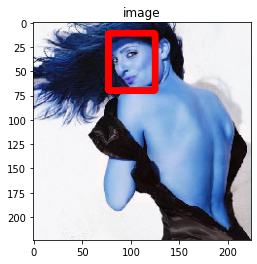

Ukuran:
224
224
SPOOF
count spoof: 1 count live 1
gbr ke: 2

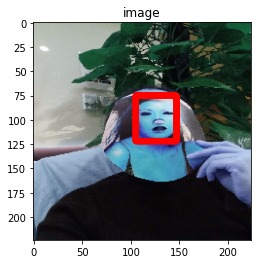

Ukuran:
224
224
SPOOF
count spoof: 2 count live 1
gbr ke: 3

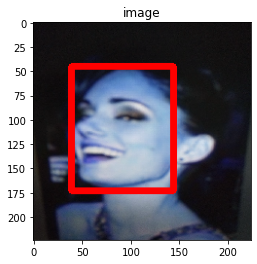

Ukuran:
224
224
SPOOF
count spoof: 3 count live 1
gbr ke: 4

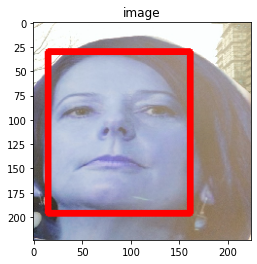

Ukuran:
224
224
SPOOF
count spoof: 4 count live 1
gbr ke: 5

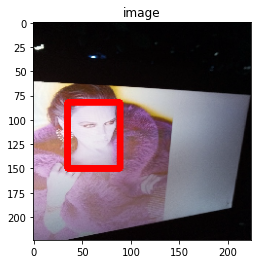

Ukuran:
224
224
LIVE
count spoof: 4 count live 2
gbr ke: 6

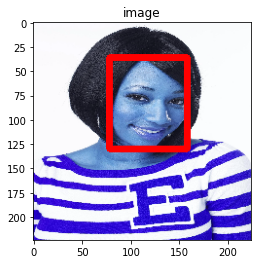

Ukuran:
224
224
LIVE
count spoof: 4 count live 3
gbr ke: 7

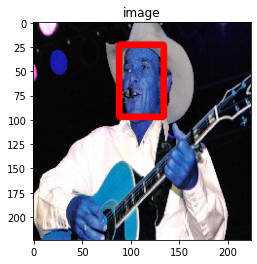

Ukuran:
224
224
SPOOF
count spoof: 5 count live 3
gbr ke: 8

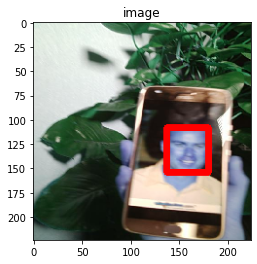

Ukuran:
224
224
SPOOF
count spoof: 6 count live 3
gbr ke: 9

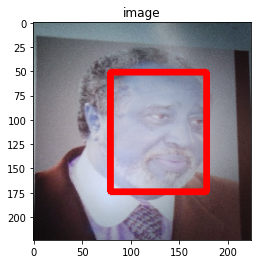

Ukuran:
224
224
LIVE
count spoof: 6 count live 4
gbr ke: 10

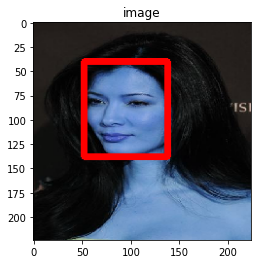

Ukuran:
224
224
SPOOF
count spoof: 7 count live 4
gbr ke: 11

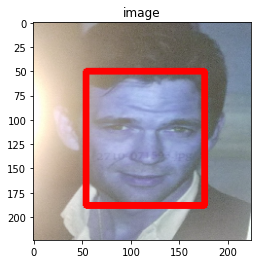

Ukuran:
224
224
SPOOF
count spoof: 8 count live 4
gbr ke: 12

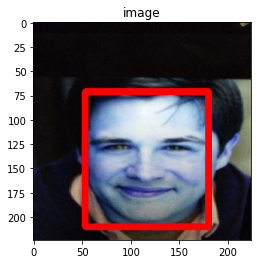

Ukuran:
224
224
LIVE
count spoof: 8 count live 5
gbr ke: 13

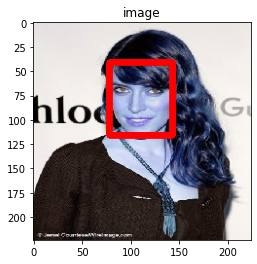

Ukuran:
224
224
SPOOF
count spoof: 9 count live 5
gbr ke: 14

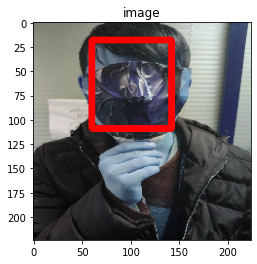

Ukuran:
224
224
LIVE
count spoof: 9 count live 6
gbr ke: 15

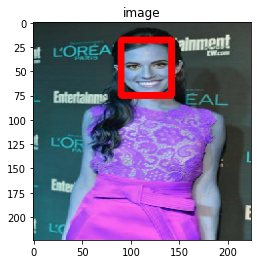

Ukuran:
224
224
SPOOF
count spoof: 10 count live 6
gbr ke: 16

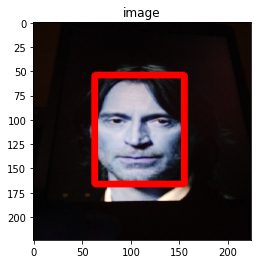

Ukuran:
224
224
SPOOF
count spoof: 11 count live 6
gbr ke: 17

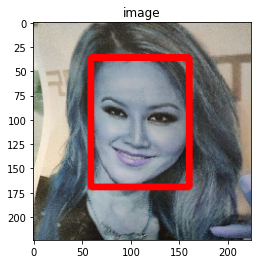

Ukuran:
224
224
LIVE
count spoof: 11 count live 7
gbr ke: 18

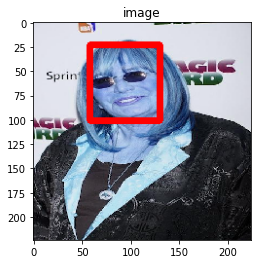

Ukuran:
224
224
SPOOF
count spoof: 12 count live 7
gbr ke: 19

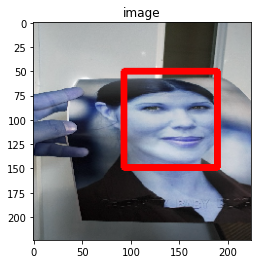

Ukuran:
224
224
LIVE
count spoof: 12 count live 8
gbr ke: 20

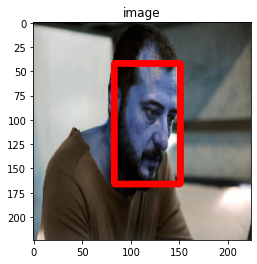

Ukuran:
224
224
SPOOF
count spoof: 13 count live 8
gbr ke: 21

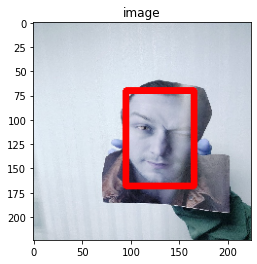

Ukuran:
224
224
SPOOF
count spoof: 14 count live 8
gbr ke: 22

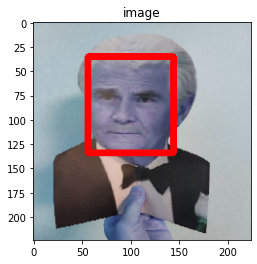

Ukuran:
224
224
SPOOF
count spoof: 15 count live 8
gbr ke: 23

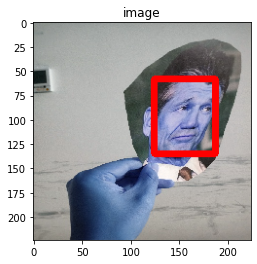

Ukuran:
224
224
SPOOF
count spoof: 16 count live 8
gbr ke: 24

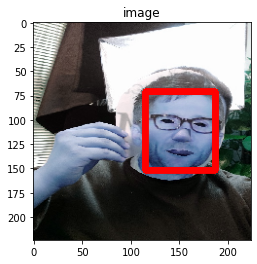

Ukuran:
224
224
SPOOF
count spoof: 17 count live 8
gbr ke: 25

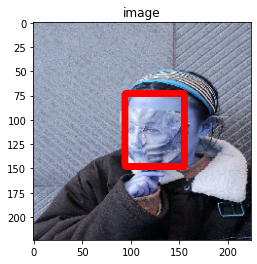

Ukuran:
224
224
SPOOF
count spoof: 18 count live 8
gbr ke: 26

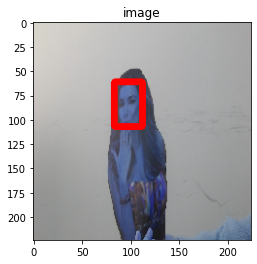

Ukuran:
224
224
SPOOF
count spoof: 19 count live 8
gbr ke: 27

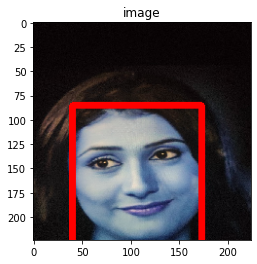

Ukuran:
224
224
SPOOF
count spoof: 20 count live 8
gbr ke: 28

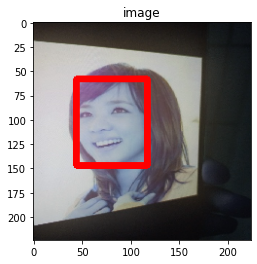

Ukuran:
224
224
SPOOF
count spoof: 21 count live 8
gbr ke: 29

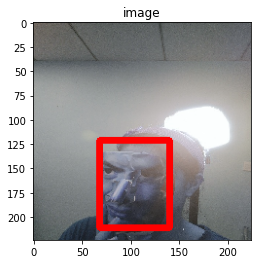

Ukuran:
224
224
SPOOF
count spoof: 22 count live 8
gbr ke: 30

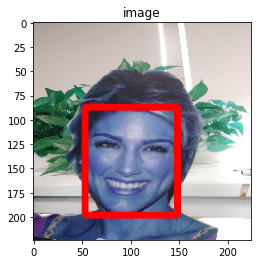

Ukuran:
224
224
SPOOF
count spoof: 23 count live 8
gbr ke: 31

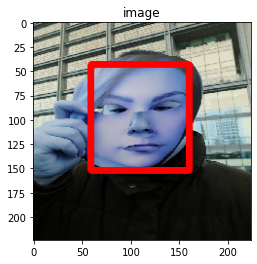

Ukuran:
224
224
SPOOF
count spoof: 24 count live 8
gbr ke: 32

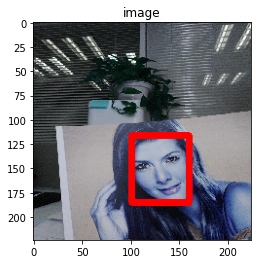

Ukuran:
224
224
LIVE
count spoof: 24 count live 9
gbr ke: 33

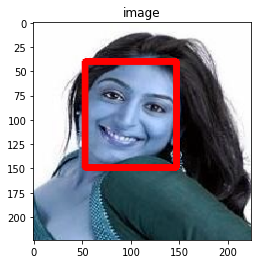

Ukuran:
224
224
SPOOF
count spoof: 25 count live 9
gbr ke: 34

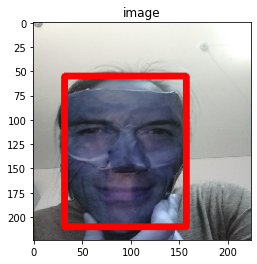

Ukuran:
224
224
SPOOF
count spoof: 26 count live 9
gbr ke: 35

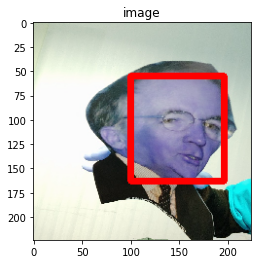

Ukuran:
224
224
SPOOF
count spoof: 27 count live 9
gbr ke: 36

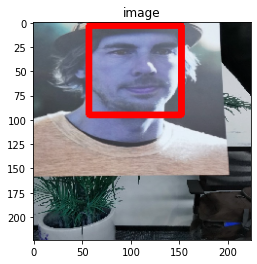

Ukuran:
224
224
LIVE
count spoof: 27 count live 10
gbr ke: 37

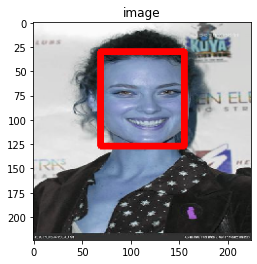

Ukuran:
224
224
SPOOF
count spoof: 28 count live 10
gbr ke: 38

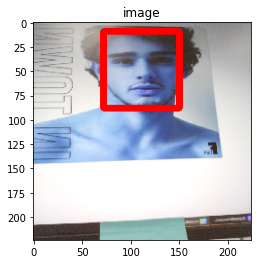

Ukuran:
224
224
SPOOF
count spoof: 29 count live 10
gbr ke: 39

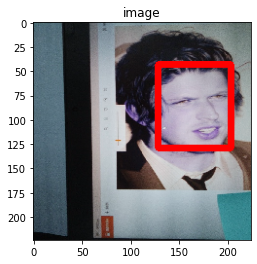

Ukuran:
224
224
SPOOF
count spoof: 30 count live 10
gbr ke: 40

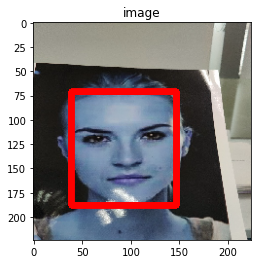

Ukuran:
224
224
SPOOF
count spoof: 31 count live 10
gbr ke: 41

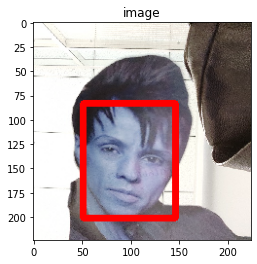

Ukuran:
224
224
SPOOF
count spoof: 32 count live 10
gbr ke: 42

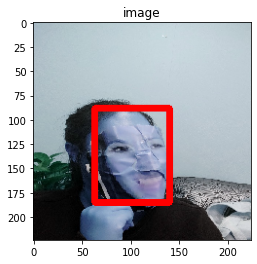

Ukuran:
224
224
LIVE
count spoof: 32 count live 11
gbr ke: 43

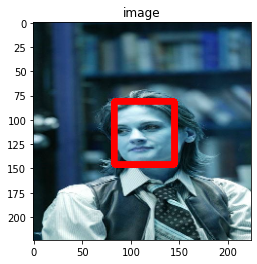

Ukuran:
224
224
SPOOF
count spoof: 33 count live 11
gbr ke: 44

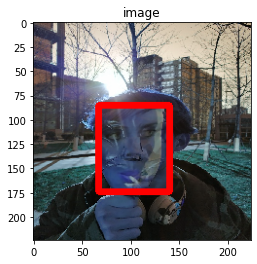

Ukuran:
224
224
SPOOF
count spoof: 34 count live 11
gbr ke: 45

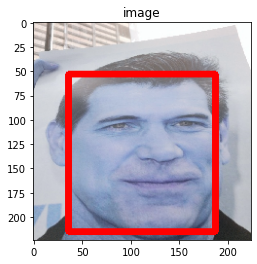

Ukuran:
224
224
SPOOF
count spoof: 35 count live 11
gbr ke: 46

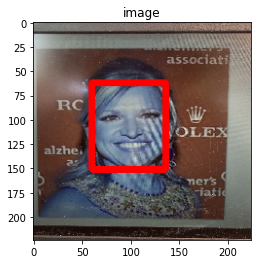

Ukuran:
224
224
SPOOF
count spoof: 36 count live 11
gbr ke: 47

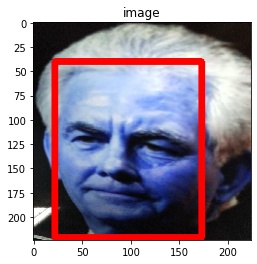

Ukuran:
224
224
Gambar tidak bisa ditemukan
SPOOF
count spoof: 37 count live 11
gbr ke: 48

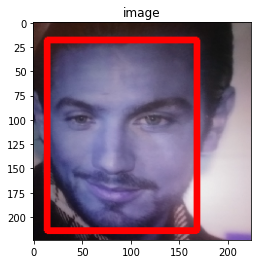

Ukuran:
224
224
LIVE
count spoof: 37 count live 12
gbr ke: 49

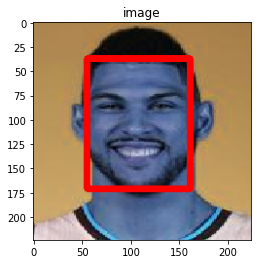

Ukuran:
224
224
Gambar tidak bisa ditemukan
SPOOF
count spoof: 38 count live 12
gbr ke: 50

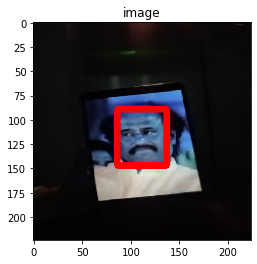

Ukuran:
224
224
SPOOF
count spoof: 39 count live 12
gbr ke: 51

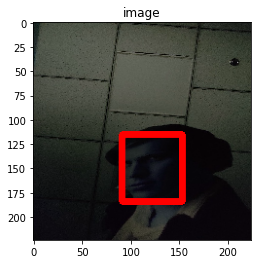

Ukuran:
224
224
LIVE
count spoof: 39 count live 13
gbr ke: 52

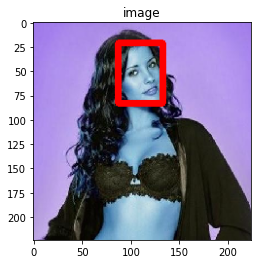

Ukuran:
224
224
SPOOF
count spoof: 40 count live 13
gbr ke: 53

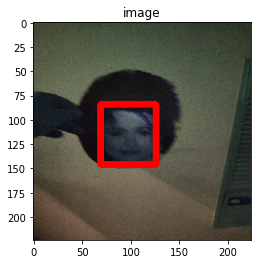

Ukuran:
224
224
SPOOF
count spoof: 41 count live 13
gbr ke: 54

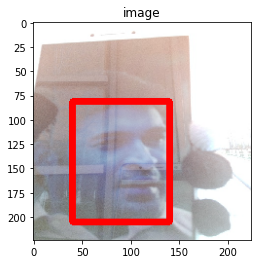

Ukuran:
224
224
LIVE
count spoof: 41 count live 14
gbr ke: 55

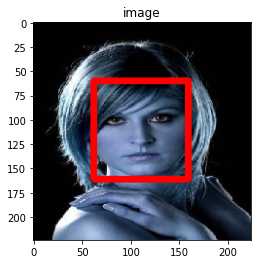

Ukuran:
224
224
LIVE
count spoof: 41 count live 15
gbr ke: 56

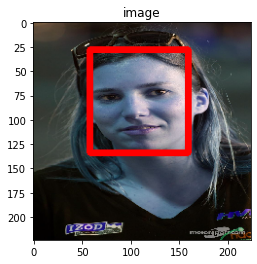

Ukuran:
224
224
LIVE
count spoof: 41 count live 16
gbr ke: 57

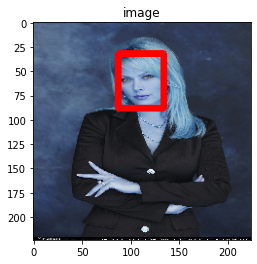

Ukuran:
224
224
SPOOF
count spoof: 42 count live 16
gbr ke: 58

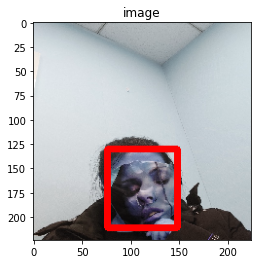

Ukuran:
224
224
SPOOF
count spoof: 43 count live 16
gbr ke: 59

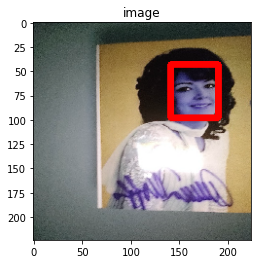

Ukuran:
224
224
SPOOF
count spoof: 44 count live 16
gbr ke: 60

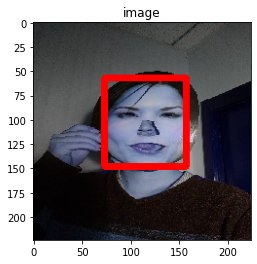

Ukuran:
224
224
LIVE
count spoof: 44 count live 17
gbr ke: 61

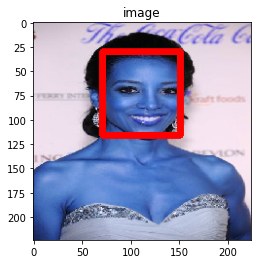

Ukuran:
224
224
SPOOF
count spoof: 45 count live 17
gbr ke: 62

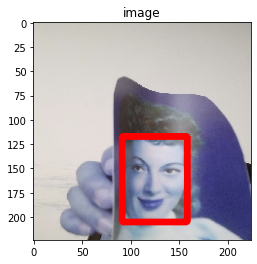

Ukuran:
224
224
LIVE
count spoof: 45 count live 18
gbr ke: 63

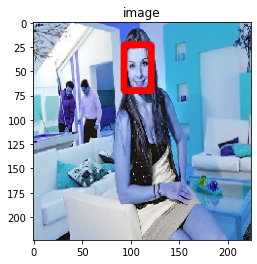

Ukuran:
224
224
SPOOF
count spoof: 46 count live 18
gbr ke: 64

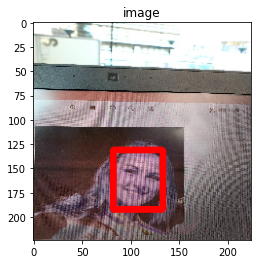

Ukuran:
224
224
SPOOF
count spoof: 47 count live 18
gbr ke: 65

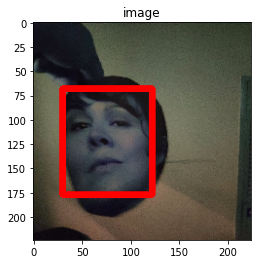

Ukuran:
224
224
SPOOF
count spoof: 48 count live 18
gbr ke: 66

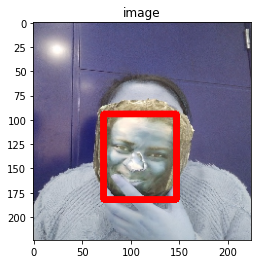

Ukuran:
224
224
SPOOF
count spoof: 49 count live 18
gbr ke: 67

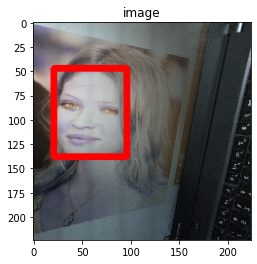

Ukuran:
224
224
SPOOF
count spoof: 50 count live 18
gbr ke: 68

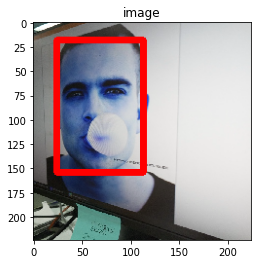

Ukuran:
224
224
LIVE
count spoof: 50 count live 19
gbr ke: 69

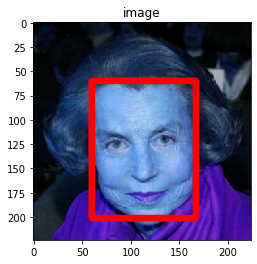

Ukuran:
224
224
LIVE
count spoof: 50 count live 20
gbr ke: 70

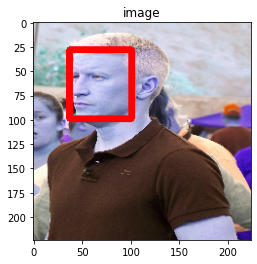

Ukuran:
224
224
Gambar tidak bisa ditemukan
LIVE
count spoof: 50 count live 21
gbr ke: 71

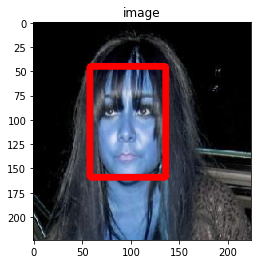

Ukuran:
224
224
LIVE
count spoof: 50 count live 22
gbr ke: 72

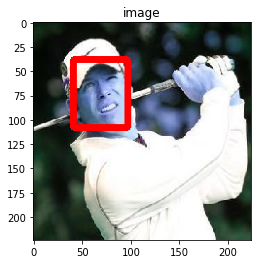

Ukuran:
224
224
Gambar tidak bisa ditemukan
LIVE
count spoof: 50 count live 23
gbr ke: 73

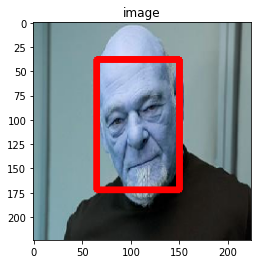

Ukuran:
224
224
LIVE
count spoof: 50 count live 24
gbr ke: 74

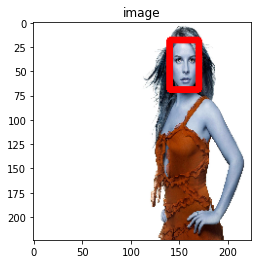

Ukuran:
224
224
Gambar tidak bisa ditemukan
LIVE
count spoof: 50 count live 25
gbr ke: 75

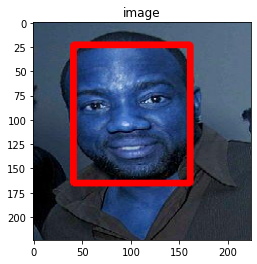

Ukuran:
224
224
LIVE
count spoof: 50 count live 26
gbr ke: 76

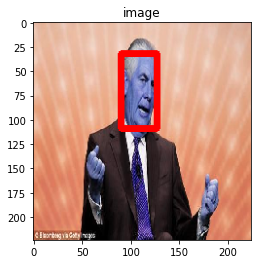

Ukuran:
224
224
LIVE
count spoof: 50 count live 27
gbr ke: 77

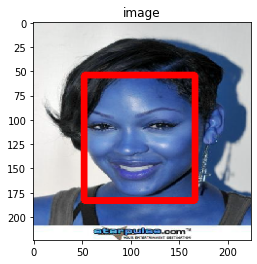

Ukuran:
224
224
LIVE
count spoof: 50 count live 28
gbr ke: 78

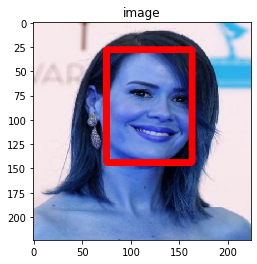

Ukuran:
224
224
LIVE
count spoof: 50 count live 29
gbr ke: 79

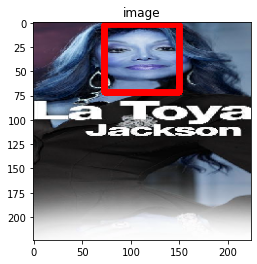

Ukuran:
224
224
Gambar tidak bisa ditemukan
LIVE
count spoof: 50 count live 30
gbr ke: 80

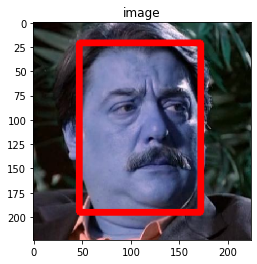

Ukuran:
224
224
LIVE
count spoof: 50 count live 31
gbr ke: 81

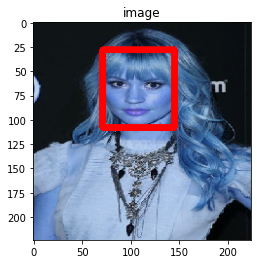

Ukuran:
224
224
LIVE
count spoof: 50 count live 32
gbr ke: 82

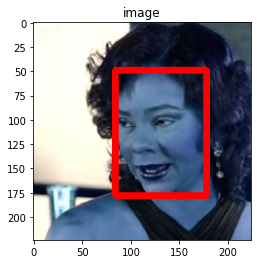

Ukuran:
224
224
LIVE
count spoof: 50 count live 33
gbr ke: 83

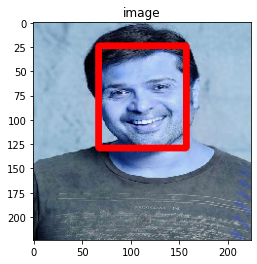

Ukuran:
224
224
LIVE
count spoof: 50 count live 34
gbr ke: 84

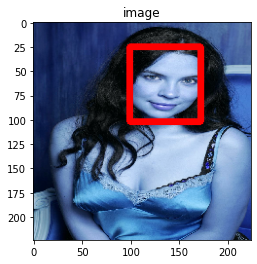

Ukuran:
224
224
LIVE
count spoof: 50 count live 35
gbr ke: 85

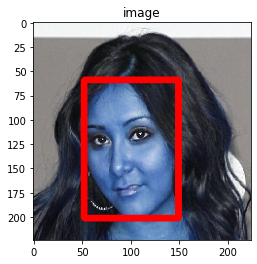

Ukuran:
224
224
LIVE
count spoof: 50 count live 36
gbr ke: 86

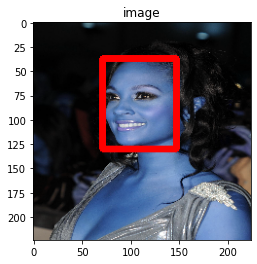

Ukuran:
224
224
LIVE
count spoof: 50 count live 37
gbr ke: 87

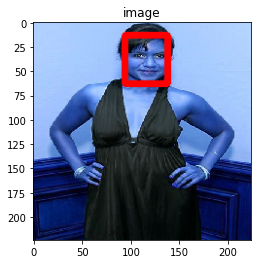

Ukuran:
224
224
LIVE
count spoof: 50 count live 38
gbr ke: 88

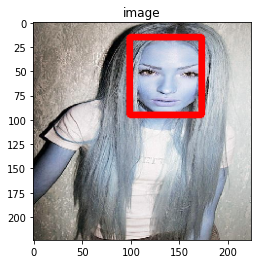

Ukuran:
224
224
LIVE
count spoof: 50 count live 39
gbr ke: 89

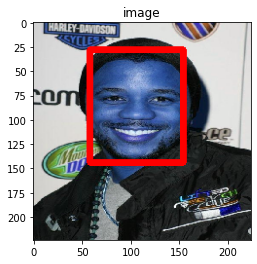

Ukuran:
224
224
LIVE
count spoof: 50 count live 40
gbr ke: 90

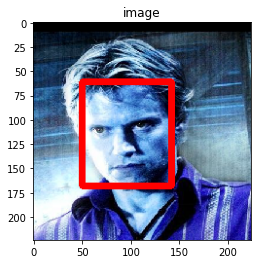

Ukuran:
224
224
LIVE
count spoof: 50 count live 41
gbr ke: 91

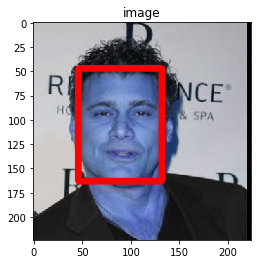

Ukuran:
224
224
Gambar tidak bisa ditemukan
LIVE
count spoof: 50 count live 42
gbr ke: 92

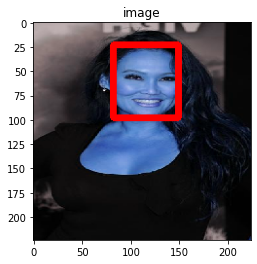

Ukuran:
224
224
LIVE
count spoof: 50 count live 43
gbr ke: 93

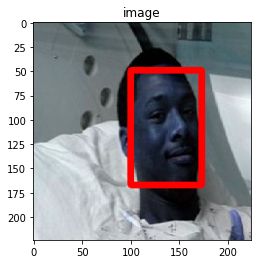

Ukuran:
224
224
LIVE
count spoof: 50 count live 44
gbr ke: 94

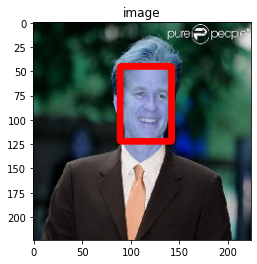

Ukuran:
224
224
LIVE
count spoof: 50 count live 45
gbr ke: 95

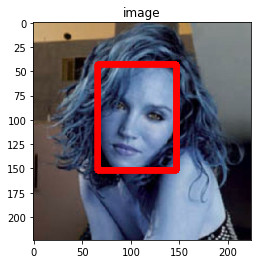

Ukuran:
224
224
Gambar tidak bisa ditemukan
LIVE
count spoof: 50 count live 46
gbr ke: 96

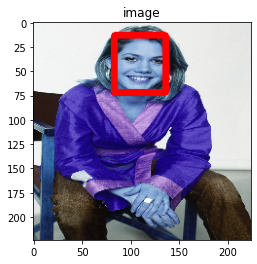

Ukuran:
224
224
LIVE
count spoof: 50 count live 47
gbr ke: 97

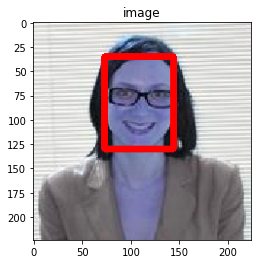

Ukuran:
224
224
LIVE
count spoof: 50 count live 48
gbr ke: 98

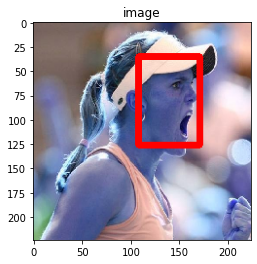

Ukuran:
224
224
LIVE
count spoof: 50 count live 49
gbr ke: 99

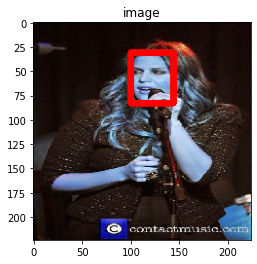

Ukuran:
224
224
LIVE
count spoof: 50 count live 50
gbr ke: 100

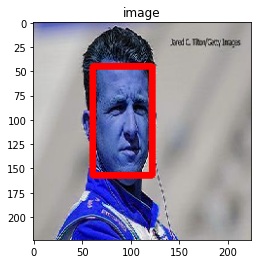

Ukuran:
224
224
BERAKHIR

Waktu untuk meload data adalah: 0.54 menit


In [ ]:
#--------------------------------------------------------#
# This step will spend some time to load the data        #
#--------------------------------------------------------#
st = time.time()
train_imgs, classes_count, class_mapping = get_data(train_path)
print()
print('Waktu untuk meload data adalah: %0.2f menit' % ((time.time()-st)/60) )


In [ ]:
if 'bg' not in classes_count:
      classes_count['bg'] = 0
      class_mapping['bg'] = len(class_mapping)
# e.g.
#    classes_count: {'live': 2, 'spoof': 6, 'bg': 0}
#    class_mapping: {'live': 0, 'spoof': 1, 'bg': 2}
C.class_mapping = class_mapping

print('Training images per class:')
pprint.pprint(classes_count)
print('Num classes (including bg) = {}'.format(len(classes_count)))
print(class_mapping)

# Save the configuration
with open(config_output_filename, 'wb') as config_f:
      pickle.dump(C,config_f)
      print('Config telah disimpan {}, dan akan diambil ketika testing '.format(config_output_filename))

Training images per class:
{'bg': 0, 'live': 50, 'spoof': 50}
Num classes (including bg) = 3
{'live': 0, 'spoof': 1, 'bg': 2}
Config telah disimpan /content/drive/MyDrive/Semester 6/TA/DATASET/Model/Resnet50/model_resnet_config.pickle, dan akan diambil ketika testing 


In [ ]:
# Shuffle the images with seed
random.seed(1)
random.shuffle(train_imgs)

print('Num train samples (images) {}'.format(len(train_imgs)))

Num train samples (images) 100


In [ ]:
# Get train data generator which generate X, Y, image_data
data_gen_train = get_anchor_gt(train_imgs, C, get_img_output_length, mode='train')

**Generator data**

In [ ]:
X, Y, image_data, debug_img, debug_num_pos = next(data_gen_train)

Looping while
Looping for
AA
BB
AAA
BBB
CCC
DDD
EEE
CC
DD
EE
FF
GG
HH
II


Original image: height=224 width=224
Resized image:  height=300 width=300 C.im_size=300
Feature map size: height=18 width=18 C.rpn_stride=16
(1, 300, 300, 3)
2 includes 'y_rpn_cls' and 'y_rpn_regr'
Shape of y_rpn_cls (1, 18, 18, 18)
Shape of y_rpn_regr (1, 18, 18, 72)
{'filepath': '/content/drive/MyDrive/Semester 6/TA/DATASET/Data/train/9103/spoof/000055.jpg', 'width': 224, 'height': 224, 'bboxes': [{'class': 'spoof', 'x1': 81, 'x2': 205, 'y1': 84, 'y2': 184}]}
Number of positive anchors for this image: 2
(array([ 4,  6, 11, 11, 11, 11]), array([ 3, 12, 11, 11, 12, 12]), array([ 2,  1,  3, 12,  3, 12]))
(array([11, 11, 11, 11, 11, 11, 11, 11]), array([11, 11, 11, 11, 12, 12, 12, 12]), array([12, 13, 14, 15, 12, 13, 14, 15]))
y_rpn_cls for possible pos anchor: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
y_rpn_regr for positive anchor: [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.        

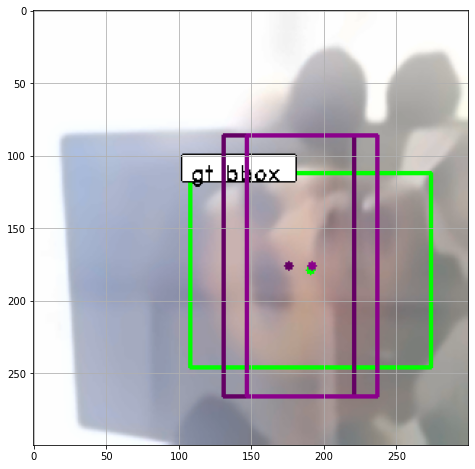

In [ ]:
print('Original image: height=%d width=%d'%(image_data['height'], image_data['width']))
print('Resized image:  height=%d width=%d C.im_size=%d'%(X.shape[1], X.shape[2], C.im_size))
print('Feature map size: height=%d width=%d C.rpn_stride=%d'%(Y[0].shape[1], Y[0].shape[2], C.rpn_stride))
print(X.shape)
print(str(len(Y))+" includes 'y_rpn_cls' and 'y_rpn_regr'")
print('Shape of y_rpn_cls {}'.format(Y[0].shape))
print('Shape of y_rpn_regr {}'.format(Y[1].shape))
print(image_data)

print('Number of positive anchors for this image: %d' % (debug_num_pos))
if debug_num_pos==0:
    gt_x1, gt_x2 = image_data['bboxes'][0]['x1']*(X.shape[2]/image_data['height']), image_data['bboxes'][0]['x2']*(X.shape[2]/image_data['height'])
    gt_y1, gt_y2 = image_data['bboxes'][0]['y1']*(X.shape[1]/image_data['width']), image_data['bboxes'][0]['y2']*(X.shape[1]/image_data['width'])
    gt_x1, gt_y1, gt_x2, gt_y2 = int(gt_x1), int(gt_y1), int(gt_x2), int(gt_y2)

    img = debug_img.copy()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    color = (0, 255, 0)
    cv2.putText(img, 'gt bbox', (gt_x1, gt_y1-5), cv2.FONT_HERSHEY_DUPLEX, 0.7, color, 1)
    cv2.rectangle(img, (gt_x1, gt_y1), (gt_x2, gt_y2), color, 2)
    cv2.circle(img, (int((gt_x1+gt_x2)/2), int((gt_y1+gt_y2)/2)), 3, color, -1)

    plt.grid()
    plt.imshow(img)
    plt.show()
else:
    cls = Y[0][0]
    pos_cls = np.where(cls==1)
    print(pos_cls)
    regr = Y[1][0]
    pos_regr = np.where(regr==1)
    print(pos_regr)
    print('y_rpn_cls for possible pos anchor: {}'.format(cls[pos_cls[0][0],pos_cls[1][0],:]))
    print('y_rpn_regr for positive anchor: {}'.format(regr[pos_regr[0][0],pos_regr[1][0],:]))

    gt_x1, gt_x2 = image_data['bboxes'][0]['x1']*(X.shape[2]/image_data['width']), image_data['bboxes'][0]['x2']*(X.shape[2]/image_data['width'])
    gt_y1, gt_y2 = image_data['bboxes'][0]['y1']*(X.shape[1]/image_data['height']), image_data['bboxes'][0]['y2']*(X.shape[1]/image_data['height'])
    gt_x1, gt_y1, gt_x2, gt_y2 = int(gt_x1), int(gt_y1), int(gt_x2), int(gt_y2)

    img = debug_img.copy()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    color = (0, 255, 0)
    #   cv2.putText(img, 'gt bbox', (gt_x1, gt_y1-5), cv2.FONT_HERSHEY_DUPLEX, 0.7, color, 1)
    cv2.rectangle(img, (gt_x1, gt_y1), (gt_x2, gt_y2), color, 2)
    cv2.circle(img, (int((gt_x1+gt_x2)/2), int((gt_y1+gt_y2)/2)), 3, color, -1)

    # Add text
    textLabel = 'gt bbox'
    (retval,baseLine) = cv2.getTextSize(textLabel,cv2.FONT_HERSHEY_COMPLEX,0.5,1)
    textOrg = (gt_x1, gt_y1+5)
    cv2.rectangle(img, (textOrg[0] - 5, textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (0, 0, 0), 2)
    cv2.rectangle(img, (textOrg[0] - 5,textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (255, 255, 255), -1)
    cv2.putText(img, textLabel, textOrg, cv2.FONT_HERSHEY_DUPLEX, 0.5, (0, 0, 0), 1)

    # Draw positive anchors according to the y_rpn_regr
    for i in range(debug_num_pos):

        color = (100+i*(155/4), 0, 100+i*(155/4))

        idx = pos_regr[2][i*4]/4
        anchor_size = C.anchor_box_scales[int(idx/3)]
        anchor_ratio = C.anchor_box_ratios[2-int((idx+1)%3)]

        center = (pos_regr[1][i*4]*C.rpn_stride, pos_regr[0][i*4]*C.rpn_stride)
        print('Center position of positive anchor: ', center)
        cv2.circle(img, center, 3, color, -1)
        anc_w, anc_h = anchor_size*anchor_ratio[0], anchor_size*anchor_ratio[1]
        cv2.rectangle(img, (center[0]-int(anc_w/2), center[1]-int(anc_h/2)), (center[0]+int(anc_w/2), center[1]+int(anc_h/2)), color, 2)
#         cv2.putText(img, 'pos anchor bbox '+str(i+1), (center[0]-int(anc_w/2), center[1]-int(anc_h/2)-5), cv2.FONT_HERSHEY_DUPLEX, 0.5, color, 1)

print('Green bboxes is ground-truth bbox. Others are positive anchors')
plt.figure(figsize=(8,8))
plt.grid()
plt.imshow(img)
plt.show()

In [ ]:
#----------------#
# BUILD THE MODEL#
#----------------#
input_shape_img = (None, None, 3)

img_input = Input(shape=input_shape_img)
roi_input = Input(shape=(None, 4))

# define the base network (VGG here, can be Resnet50, Inception, etc)
shared_layers = nn_base(img_input, trainable=True)



In [ ]:
print(roi_input)

KerasTensor(type_spec=TensorSpec(shape=(None, None, 4), dtype=tf.float32, name='input_2'), name='input_2', description="created by layer 'input_2'")


In [ ]:
# define the RPN, built on the base layers
num_anchors = len(C.anchor_box_scales) * len(C.anchor_box_ratios) # 9
rpn = rpn_layer(shared_layers, num_anchors)

classifier = classifier(shared_layers, roi_input, C.num_rois, nb_classes=len(classes_count))

model_rpn = Model(img_input, rpn[:2])
model_classifier = Model([img_input, roi_input], classifier)

# this is a model that holds both the RPN and the classifier, used to load/save weights for the models
model_all = Model([img_input, roi_input], rpn[:2] + classifier)

# Because the google colab can only run the session several hours one time (then you need to connect again), 
# we need to save the model and load the model to continue training
if not os.path.isfile(C.model_path):
    #If this is the begin of the training, load the pre-traind base network such as vgg-16
    try:
        print('This is the first time of your training')
        print('loading weights from {}'.format(C.base_net_weights))
        model_rpn.load_weights(C.base_net_weights, by_name=True)
        model_classifier.load_weights(C.base_net_weights, by_name=True)
    except:
        print('Could not load pretrained model weights. Weights can be found in the keras application folder \
            https://github.com/fchollet/keras/tree/master/keras/applications')
    
    # Create the record.csv file to record losses, acc and mAP
    record_df = pd.DataFrame(columns=['mean_overlapping_bboxes', 'class_acc', 'loss_rpn_cls', 'loss_rpn_regr', 'loss_class_cls', 'loss_class_regr', 'curr_loss', 'elapsed_time', 'mAP'])
else:
    # If this is a continued training, load the trained model from before
    print('Continue training based on previous trained model')
    print('Loading weights from {}'.format(C.model_path))
    model_rpn.load_weights(C.model_path, by_name=True)
    model_classifier.load_weights(C.model_path, by_name=True)
    
    # Load the records
    record_df = pd.read_csv(record_path)

    r_mean_overlapping_bboxes = record_df['mean_overlapping_bboxes']
    r_class_acc = record_df['class_acc']
    r_loss_rpn_cls = record_df['loss_rpn_cls']
    r_loss_rpn_regr = record_df['loss_rpn_regr']
    r_loss_class_cls = record_df['loss_class_cls']
    r_loss_class_regr = record_df['loss_class_regr']
    r_curr_loss = record_df['curr_loss']
    r_elapsed_time = record_df['elapsed_time']
    r_mAP = record_df['mAP']

    print('Already train %dK batches'% (len(record_df)))

In [ ]:
optimizer = Adam(learning_rate=1e-5)
optimizer_classifier = Adam(learning_rate=1e-5)
model_rpn.compile(optimizer=optimizer, loss=[rpn_loss_cls(num_anchors), rpn_loss_regr(num_anchors)])
model_classifier.compile(optimizer=optimizer_classifier, loss=[class_loss_cls, class_loss_regr(len(classes_count)-1)], metrics={'dense_class_{}'.format(len(classes_count)): 'accuracy'})
model_all.compile(optimizer='sgd', loss='mae')

In [ ]:
model_classifier.summary()

In [ ]:
# Training setting
total_epochs = len(record_df)
r_epochs = len(record_df)

epoch_length = 100
num_epochs = 20
iter_num = 0

total_epochs += num_epochs

losses = np.zeros((epoch_length, 5))
rpn_accuracy_rpn_monitor = []
rpn_accuracy_for_epoch = []

if len(record_df)==0:
    best_loss = np.Inf
else:
    best_loss = np.min(r_curr_loss)

In [ ]:
print(len(record_df))

In [ ]:
model_rpn.summary()

In [ ]:
start_time = time.time()
for epoch_num in range(num_epochs):

    progbar = generic_utils.Progbar(epoch_length)
    print('Epoch {}/{}'.format(r_epochs + 1, total_epochs))
    
    r_epochs += 1
    print("sebelum looping")
    while True:
        try:
            print("A")

            if len(rpn_accuracy_rpn_monitor) == epoch_length and C.verbose:
                mean_overlapping_bboxes = float(sum(rpn_accuracy_rpn_monitor))/len(rpn_accuracy_rpn_monitor)
                rpn_accuracy_rpn_monitor = []
#                 print('Average number of overlapping bounding boxes from RPN = {} for {} previous iterations'.format(mean_overlapping_bboxes, epoch_length))
                if mean_overlapping_bboxes == 0:
                    print('RPN is not producing bounding boxes that overlap the ground truth boxes. Check RPN settings or keep training.')
            
            print("B")

            # Generate X (x_img) and label Y ([y_rpn_cls, y_rpn_regr])
            X, Y, img_data, debug_img, debug_num_pos = next(data_gen_train)
            
            print("C")

            # Train rpn model and get loss value [_, loss_rpn_cls, loss_rpn_regr]
            loss_rpn = model_rpn.train_on_batch(X, Y)
            
            print("D")

            # Get predicted rpn from rpn model [rpn_cls, rpn_regr]
            P_rpn = model_rpn.predict_on_batch(X)
            
            print("E")

            # R: bboxes (shape=(300,4))
            # Convert rpn layer to roi bboxes
            R = rpn_to_roi(P_rpn[0], P_rpn[1], C, K.image_data_format(), use_regr=True, overlap_thresh=0.7, max_boxes=300)
            
            print("F")

            # note: calc_iou converts from (x1,y1,x2,y2) to (x,y,w,h) format
            # X2: bboxes that iou > C.classifier_min_overlap for all gt bboxes in 300 non_max_suppression bboxes
            # Y1: one hot code for bboxes from above => x_roi (X)
            # Y2: corresponding labels and corresponding gt bboxes
            X2, Y1, Y2, IouS = calc_iou(R, img_data, C, class_mapping)

            print("G")

            # If X2 is None means there are no matching bboxes
            if X2 is None:
                rpn_accuracy_rpn_monitor.append(0)
                rpn_accuracy_for_epoch.append(0)
                continue
            
            print("H")

            # Find out the positive anchors and negative anchors
            neg_samples = np.where(Y1[0, :, -1] == 1)
            pos_samples = np.where(Y1[0, :, -1] == 0)
            
            print("I")

            if len(neg_samples) > 0:
                neg_samples = neg_samples[0]
            else:
                neg_samples = []

            print("J")
            if len(pos_samples) > 0:
                pos_samples = pos_samples[0]
            else:
                pos_samples = []

            print("K")

            rpn_accuracy_rpn_monitor.append(len(pos_samples))
            rpn_accuracy_for_epoch.append((len(pos_samples)))

            print("L")

            if C.num_rois > 1:
                # If number of positive anchors is larger than 4//2 = 2, randomly choose 2 pos samples
                if len(pos_samples) < C.num_rois//2:
                    selected_pos_samples = pos_samples.tolist()
                else:
                    selected_pos_samples = np.random.choice(pos_samples, C.num_rois//2, replace=False).tolist()
                
                # Randomly choose (num_rois - num_pos) neg samples
                try:
                    selected_neg_samples = np.random.choice(neg_samples, C.num_rois - len(selected_pos_samples), replace=False).tolist()
                except:
                    selected_neg_samples = np.random.choice(neg_samples, C.num_rois - len(selected_pos_samples), replace=True).tolist()
                
                # Save all the pos and neg samples in sel_samples
                sel_samples = selected_pos_samples + selected_neg_samples
            else:
                # in the extreme case where num_rois = 1, we pick a random pos or neg sample
                selected_pos_samples = pos_samples.tolist()
                selected_neg_samples = neg_samples.tolist()
                if np.random.randint(0, 2):
                    sel_samples = random.choice(neg_samples)
                else:
                    sel_samples = random.choice(pos_samples)

            # training_data: [X, X2[:, sel_samples, :]]
            # labels: [Y1[:, sel_samples, :], Y2[:, sel_samples, :]]
            #  X                     => img_data resized image
            #  X2[:, sel_samples, :] => num_rois (4 in here) bboxes which contains selected neg and pos
            #  Y1[:, sel_samples, :] => one hot encode for num_rois bboxes which contains selected neg and pos
            #  Y2[:, sel_samples, :] => labels and gt bboxes for num_rois bboxes which contains selected neg and pos
            loss_class = model_classifier.train_on_batch([X, X2[:, sel_samples, :]], [Y1[:, sel_samples, :], Y2[:, sel_samples, :]])

            losses[iter_num, 0] = loss_rpn[1]
            losses[iter_num, 1] = loss_rpn[2]

            losses[iter_num, 2] = loss_class[1]
            losses[iter_num, 3] = loss_class[2]
            losses[iter_num, 4] = loss_class[3]

            iter_num += 1

            progbar.update(iter_num, [('rpn_cls', np.mean(losses[:iter_num, 0])), ('rpn_regr', np.mean(losses[:iter_num, 1])),
                                      ('final_cls', np.mean(losses[:iter_num, 2])), ('final_regr', np.mean(losses[:iter_num, 3]))])

            if iter_num == epoch_length:
                loss_rpn_cls = np.mean(losses[:, 0])
                loss_rpn_regr = np.mean(losses[:, 1])
                loss_class_cls = np.mean(losses[:, 2])
                loss_class_regr = np.mean(losses[:, 3])
                class_acc = np.mean(losses[:, 4])

                mean_overlapping_bboxes = float(sum(rpn_accuracy_for_epoch)) / len(rpn_accuracy_for_epoch)
                rpn_accuracy_for_epoch = []

                if C.verbose:
                    print('Mean number of bounding boxes from RPN overlapping ground truth boxes: {}'.format(mean_overlapping_bboxes))
                    print('Classifier accuracy for bounding boxes from RPN: {}'.format(class_acc))
                    print('Loss RPN classifier: {}'.format(loss_rpn_cls))
                    print('Loss RPN regression: {}'.format(loss_rpn_regr))
                    print('Loss Detector classifier: {}'.format(loss_class_cls))
                    print('Loss Detector regression: {}'.format(loss_class_regr))
                    print('Total loss: {}'.format(loss_rpn_cls + loss_rpn_regr + loss_class_cls + loss_class_regr))
                    print('Elapsed time: {}'.format(time.time() - start_time))
                    elapsed_time = (time.time()-start_time)/60

                curr_loss = loss_rpn_cls + loss_rpn_regr + loss_class_cls + loss_class_regr
                iter_num = 0
                start_time = time.time()

                if curr_loss < best_loss:
                    if C.verbose:
                        print('Total loss decreased from {} to {}, saving weights'.format(best_loss,curr_loss))
                    best_loss = curr_loss
                    model_all.save_weights(C.model_path)

                new_row = {'mean_overlapping_bboxes':round(mean_overlapping_bboxes, 3), 
                           'class_acc':round(class_acc, 3), 
                           'loss_rpn_cls':round(loss_rpn_cls, 3), 
                           'loss_rpn_regr':round(loss_rpn_regr, 3), 
                           'loss_class_cls':round(loss_class_cls, 3), 
                           'loss_class_regr':round(loss_class_regr, 3), 
                           'curr_loss':round(curr_loss, 3), 
                           'elapsed_time':round(elapsed_time, 3), 
                           'mAP': 0}

                record_df = record_df.append(new_row, ignore_index=True)
                record_df.to_csv(record_path, index=0)

                break

        except Exception as e:
            print('Exception: {}'.format(e))
            continue

print('Training complete, exiting.')

**Visualisasi Data**

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['mean_overlapping_bboxes'], 'r')
plt.title('mean_overlapping_bboxes')
plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['class_acc'], 'r')
plt.title('class_acc')

plt.show()

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['loss_rpn_cls'], 'r')
plt.title('loss_rpn_cls')
plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['loss_rpn_regr'], 'r')
plt.title('loss_rpn_regr')
plt.show()


plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['loss_class_cls'], 'r')
plt.title('loss_class_cls')
plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['loss_class_regr'], 'r')
plt.title('loss_class_regr')
plt.show()

plt.plot(np.arange(0, r_epochs), record_df['curr_loss'], 'r')
plt.title('total_loss')
plt.show()